In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from scipy.stats import skew, norm
from sklearn.model_selection import train_test_split
import scipy.stats as stats
import pylab
import warnings
warnings.filterwarnings('ignore')
from sklearn import preprocessing

In [2]:
%cd /content/drive/MyDrive/machine_learning_projects/XOrthim

/content/drive/MyDrive/machine_learning_projects/XOrthim


In [3]:
%pwd

'/content/drive/MyDrive/machine_learning_projects/XOrthim'

In [4]:
%ls

'Data Scientist THA v1.0.pdf'   housing_data_900.gsheet   Untitled1.ipynb   XOrithm.ipynb
 housing_data_900.csv           Untitled0.ipynb           Untitled2.ipynb


# Functions

In [5]:
def data_info(df):
  '''
  Function that prints some important informations about the raw dataset at the beginning of the EDA select_dtypes

  parameters:
    df(DataFrame):dataframe of the raw dataset
  '''
  #print('sample of the data \n', df.head(5),'\n')
  pd.set_option('display.max_columns', None)
  pd.set_option('display.max_rows', None)
  print('data types \n', df.info(),'\n \n')
  print('data describtion \n', df.describe().T,'\n \n')

  num_features = df.select_dtypes("number").columns
  print('numeric columns \n', num_features ,'\n \n')
  print('unique values for numeric features \n', df[num_features].nunique(),'\n \n')

  obj_features = df.select_dtypes(include= object).columns
  print('object columns \n', obj_features,'\n \n')
  print('unique values for object features \n', df[obj_features].nunique(),'\n \n')


  #print('unique values for each feature \n', df.nunique(),'\n \n')
  print('sum of missing values \n',df.isna().sum(),'\n \n')
  print('percentage of missing values \n', df.isna().mean(),'\n \n')
  #print('skewness of numerical data', df.skew())
  sns.heatmap(df.isna(), cbar = False, cmap = 'viridis')

In [6]:
def vis(df,feature):
  '''
  Function that visualize the histplot, boxplot, and violinplot for a specific feature in the dataset to give insight on the distribution, the IQR, and if there is any outliers

  parameters:
    df(DataFrame):dataframe of the dataset
    feature(string): a column in the sent received dataset
  '''
  sns.set()
  plt.figure(figsize = (7,5))
  fig, axes = plt.subplots(2, 2,figsize = (15,8))
  sns.histplot(x = df[feature],ax=axes[0,0],kde = True,stat = 'density')
  sns.boxplot(data = df, x= feature,ax=axes[0,1])
  sns.violinplot(x = df[feature],ax=axes[1,0])


In [7]:
def detect_outliers_iqr(df,features):
  '''
  Function that calculates the lower and upper bounf of a nuerical feature to then get the outliers that are not within these bounds and prints these outliers values

  Parameters:
    df(DataFrame): dataframe of the dataset
    feature(list): A list of column names in the DataFrame to analyze.
  '''
  outliers = []
  before_lwr_bound= []
  after_upr_bound =[]
  for feature in features:
    df[feature] = sorted(df[feature])
    q1 = np.percentile(df[feature], 25)
    q3 = np.percentile(df[feature], 75)
    IQR = q3- q1
    lwr_bound = q1 - (1.5*IQR)
    upr_bound = q3 + (1.5*IQR)

    for i in df[feature]:
      if (i<lwr_bound):
        outliers.append(i)
        before_lwr_bound.append(i)
      if (i>upr_bound):
        outliers.append(i)
        after_upr_bound.append(i)
    print("\n \n -------------------", feature, "------------------- \n")
    print("Outliers of ",feature ," from IQR method: ", 'length: ',len(outliers) ," - ", set(outliers))
    print('before lower bound of ',feature ," : ",'length: ', len(before_lwr_bound) ," - ", set(before_lwr_bound))
    print('after upper bound of ',feature ," : ", 'length: ',len(after_upr_bound)," - ", set(after_upr_bound))
    sns.histplot(x=outliers)
    plt.xlabel(feature + ' (Outliers)')
    plt.ylabel('Frequency')
    plt.title('Histogram of Outliers in ' + feature)
    plt.show()




def detect_outliers_iqr_exclude_zeros(df, features):
  """
  Function that calculates IQR-based outliers, excluding zeros, and displays results and histograms.

  Parameters:
      df (pandas.DataFrame): The dataset containing the features.
      features (list): A list of column names in the DataFrame to analyze.
  """

  for feature in features:
    df_filtered = df[df[feature] != 0]

    q1 = np.percentile(df_filtered[feature], 25)
    q3 = np.percentile(df_filtered[feature], 75)
    IQR = q3 - q1

    lwr_bound = q1 - (1.5 * IQR) if q1 > 0 else 0
    upr_bound = q3 + (1.5 * IQR)

    outliers = []
    before_lwr_bound = []
    after_upr_bound = []

    for i in df_filtered[feature]:
      if (i < lwr_bound):
        outliers.append(i)
        before_lwr_bound.append(i)
      if (i > upr_bound):
        outliers.append(i)
        after_upr_bound.append(i)

    print("\n \n -------------------", feature, "------------------- \n")
    print("Outliers of", feature, "from IQR method: ", 'length:', len(outliers), " - ", set(outliers))
    print('before lower bound of', feature, ":", 'length:', len(before_lwr_bound), " - ", set(before_lwr_bound))
    print('after upper bound of', feature, ":", 'length:', len(after_upr_bound), " - ", set(after_upr_bound))

    if len(outliers) > 0:
      sns.histplot(x=outliers)
      plt.xlabel(feature + ' (Outliers)')
      plt.ylabel('Frequency')
      plt.title('Histogram of Outliers in zero excluded' + feature)
      plt.show()


In [8]:
def detect_distriution(df, num_features):
  '''
  Function that detect the skewness from the normal distribution of the numerical features in the dataset and divid them into categories (highly_positively_skewed, highly_negatively_skewed, moderately_positively_skewed, moderately_negatively_skewed, and normally_distributed) which each of them have a range of skewness

  parameters:
    df(DataFrame):dataframe of the dataset

  Returns:
    non_normal_features(string): a string that contains all non uniform distributed features
  '''
  #print(df.skew())
  #df.select_dtypes("number")
  highly_positively_skewed = [x for x in num_features if dict(df.skew(numeric_only=True)>1)[x] == True]
  highly_negatively_skewed = [x for x in num_features if dict(df.skew(numeric_only=True)<-1)[x] == True]
  moderately_positively_skewed = [x for x in num_features if (dict(df.skew(numeric_only=True)>0.5 )[x] == True) and (dict(df.skew(numeric_only=True)<1 )[x] == True)]
  moderately_negatively_skewed = [x for x in num_features if (dict(df.skew(numeric_only=True)>-0.5 )[x] == True) and (dict(df.skew(numeric_only=True)<-1 )[x] == True)]
  normally_distributed = [x for x in num_features if (dict(df.skew(numeric_only=True)>-0.5 )[x] == True) and (dict(df.skew(numeric_only=True)<0.5 )[x] == True)]
  print()
  print('features that are highly positively skewed (skewness >1) are ',highly_positively_skewed)
  print('features that are highly negatively skewed (skewness <-1) are ',highly_negatively_skewed)
  print('features that are moderately positively skewed (0.5 < skewness < 1 ) are ',moderately_positively_skewed)
  print('features that are moderately negatively skewed (-0.5 < skewness < -1 ) are ',moderately_negatively_skewed)
  print('features that are normally distributed (-0.5 < skewness < 0.5 ) are',normally_distributed)
  print()

  for col in num_features:
    plt.subplot(1,2,1)
    sns.violinplot(df[col])
    plt.subplot(1,2,2)
    sns.histplot(df[col],kde = True,stat = 'density')
    plt.show()

  non_normal_features = highly_positively_skewed + highly_negatively_skewed + moderately_positively_skewed + moderately_negatively_skewed

  print('transformation ',non_normal_features,' to change the distribution')
  return non_normal_features



def detect_distribution_exclude_zeros(df, num_features):
  """
  Function that analyzes the skewness of numerical features (excluding zeros) and categorizes them based on skewness levels.

  Parameters:
      df (pandas.DataFrame): The dataset containing the features.
      num_features (list): A list of column names (numerical features) in the DataFrame to analyze.

  Returns:
      non_normal_features (list): A list of feature names that are not normally distributed.
  """

  highly_positively_skewed = []
  highly_negatively_skewed = []
  moderately_positively_skewed = []
  moderately_negatively_skewed = []
  normally_distributed = []

  for feature in num_features:
    df_filtered = df[df[feature] != 0]

    skewness = df_filtered[feature].skew()

    if skewness > 1:
      highly_positively_skewed.append(feature)
    elif skewness < -1:
      highly_negatively_skewed.append(feature)
    elif 0.5 < skewness < 1:
      moderately_positively_skewed.append(feature)
    elif -0.5 < skewness < -1:
      moderately_negatively_skewed.append(feature)
    else:
      normally_distributed.append(feature)

  print()
  print('Features that are highly positively skewed (skewness > 1) are:', highly_positively_skewed)
  print('Features that are highly negatively skewed (skewness <-1) are:', highly_negatively_skewed)
  print('Features that are moderately positively skewed (0.5 < skewness < 1) are:', moderately_positively_skewed)
  print('Features that are moderately negatively skewed (-0.5 < skewness < -1) are:', moderately_negatively_skewed)
  print('Features that are normally distributed (-0.5 < skewness < 0.5) are:', normally_distributed)
  print()

  for col in num_features:
    df_filtered = df[df[col] != 0]
    plt.subplot(1, 2, 1)
    sns.violinplot(df_filtered[col])
    plt.subplot(1, 2, 2)
    sns.histplot(df_filtered[col], kde=True, stat='density')
    plt.show()

  non_normal_features = highly_positively_skewed + highly_negatively_skewed + moderately_positively_skewed + moderately_negatively_skewed

  print('Features requiring transformation (not normally distributed):', non_normal_features)
  return non_normal_features


In [9]:
def plot_kde_probplot(df,feature,title):
  '''
  Function that plots the kdeplot and subplot to them give us insight of which transformationis better for this feature from the plotting and the calculations of the mean and std

  parameters:
    df(DataFrame):dataframe of the dataset
    feature(string): a column in the sent received dataset
    title(string): a string that indicates what transformation are we applying for visualization
  '''
  plt.figure(figsize = (5,3))
  plt.subplot(1,2,1)
  sns.kdeplot(df[feature])
  plt.subplot(1,2,2)
  stats.probplot(df[feature], plot = pylab)
  print('mean = ',df[feature].mean(),' std = ',df[feature].std())
  plt.title(title)
  plt.show()

def normality(df, feature):#original, log, reciprocal, square root, and exponential
  '''
  Function that calls for the plot_kde_probplot function to plot different types of transformations( log, reciprocal, square root, and exponential) for a scpecific feature to give us insight which is the best according to the ploting and calculations displayed

  Parameters:
    df(DataFrame):dataframe of the dataset
    feature(string): a column in the sent received dataset
  '''
  #original
  plot_kde_probplot(df,feature,'original')
  print(df[feature].skew(),'\n')

  #log
  test = pd.DataFrame(np.log(df[feature].dropna()))
  plot_kde_probplot(test, feature,'log')
  print(test.skew(),'\n')

  #reciprocal
  test = pd.DataFrame(1/df[feature].dropna())
  plot_kde_probplot(test, feature,'reciprotical')
  print(test.skew(),'\n')

  #square root
  test = pd.DataFrame(np.sqrt(df[feature].dropna()))
  plot_kde_probplot(test, feature,'square root')
  print(test.skew(),'\n')

  #exponential
  test = pd.DataFrame(df[feature].dropna()**(1/1.2))
  plot_kde_probplot(test,feature,'exponential')
  print(test.skew(),'\n')



features function

In [11]:
def outliers_handeler(df,features):
  '''
  Function that handels outliers and put them in the range of the IQR

  parameters:
    df (pandas.DataFrame): The dataset containing the features.
      features (list): A list of column names (numerical features) in the DataFrame to analyze.
  '''
  for feature in features:
    tenth_percentile = np.percentile(df[feature],10)
    ninetieth_percentile = np.percentile(df[feature],90)
    b = np.where(df[feature]< tenth_percentile, tenth_percentile, df[feature])
    b = np.where(b>ninetieth_percentile, ninetieth_percentile, b)
    df[feature] = pd.DataFrame(b)


def outliers_handler_exclude_zeros(df, features):
  """
  Function that handles outliers in numerical features (excluding zeros) by capping them to the IQR range.

  Parameters:
      df (pandas.DataFrame): The dataset containing the features.
      features (list): A list of column names (numerical features) in the DataFrame to analyze.
  """

  for feature in features:
    df_filtered = df[df[feature] != 0]

    tenth_percentile = np.percentile(df_filtered[feature], 5)
    ninetieth_percentile = np.percentile(df_filtered[feature], 95)

    df.loc[df[feature] < tenth_percentile, feature] = tenth_percentile
    df.loc[df[feature] > ninetieth_percentile, feature] = ninetieth_percentile

  return df

vsualization functions

In [12]:
def detect_box_voilin_hist(df,num_features):
  fig, axes = plt.subplots(len(num_features), 3, figsize=(30, len(num_features)*5))

  for i, feature in enumerate(num_features):
      box_ax = axes[i, 0]
      violin_ax = axes[i, 1]
      hist_ax = axes[i, 2]

      sns.boxplot(x=df[feature], ax=box_ax)
      box_ax.set_xlabel(feature)
      box_ax.set_title(f"{feature} - Boxplot", fontsize=20)

      sns.violinplot(x=df[feature], ax=violin_ax)
      violin_ax.set_xlabel(feature)
      violin_ax.set_title(f"{feature} - Violin Plot", fontsize=20)

      sns.histplot(df[feature], ax=hist_ax,kde = True,stat = 'density')
      hist_ax.set_xlabel(feature)
      hist_ax.set_title(f"{feature} - Histogram", fontsize=20)

  plt.tight_layout()

  plt.show()


def detect_box_voilin_hist_exclude_zeros(df, num_features):
  """
  Function that creates boxplots, violin plots, and histograms for numerical features, excluding zeros.

  Parameters:
      df (pandas.DataFrame): The dataset containing the features.
      num_features (list): A list of column names (numerical features) in the DataFrame to analyze.
  """

  fig, axes = plt.subplots(len(num_features), 3, figsize=(30, len(num_features)*5))  # Adjust figsize as needed

  for i, feature in enumerate(num_features):
    df_filtered = df[df[feature] != 0]

    box_ax = axes[i, 0]
    violin_ax = axes[i, 1]
    hist_ax = axes[i, 2]

    sns.boxplot(x=df_filtered[feature], ax=box_ax)
    box_ax.set_xlabel(feature)
    box_ax.set_title(f"{feature} - Boxplot", fontsize=20)

    sns.violinplot(x=df_filtered[feature], ax=violin_ax)
    violin_ax.set_xlabel(feature)
    violin_ax.set_title(f"{feature} - Violin Plot", fontsize=20)

    sns.histplot(df_filtered[feature], ax=hist_ax, kde=True, stat='density')
    hist_ax.set_xlabel(feature)
    hist_ax.set_title(f"{feature} - Histogram", fontsize=20)

  plt.tight_layout()
  plt.show()

 cleaning functions

In [13]:
def remove_duplicates(df):
  '''
  Function that removed duplicates

  parameters:
    df(dataframe)
  '''
  print('nuber of duplicats = ',df[df.duplicated()==True].shape[0])
  print('assumed numbers of rows remaining = ',df.shape[0] - df[df.duplicated()==True].shape[0])
  df.drop_duplicates(keep = 'first', inplace = True)
  df.reset_index(inplace = True,drop=True)
  print('number of rows after removing the duplicates = ',df.shape[0])

In [14]:
def log_transform_exclude_zeros(df, log_trans):
  """
  Function that applies log transformation to specified features, excluding zeros.

  Parameters:
      df (pandas.DataFrame): The dataset containing the features.
      log_trans (list): A list of column names (numerical features) to log-transform.

  Returns:
      df (pandas.DataFrame): The DataFrame with log-transformed features (zeros remain unchanged).
  """

  for feature in log_trans:
    df_filtered = df.loc[df[feature] > 0, :]

    df_filtered[feature] = np.log1p(df_filtered[feature])

    df.loc[df_filtered.index, feature] = df_filtered[feature]

  return df

In [15]:
def label_encoding(df,feature,categories):
  '''
  Funciton that label encode a feature accordning to specific order

  Parameters:
    df(dataframe)
    feature(string)
    categories(list): a lsit of the categories in the received feature that wil be replaced in the same order
  '''
  for i,cat in enumerate (categories):
    df[feature].replace({cat:i},inplace = True)


def min_max_scaler(df, columns):
  """
  Performs min-max scaling on specified columns in a DataFrame.

  Parameters:
      df (pandas.DataFrame): The DataFrame containing the features.
      columns (list): A list of column names (numerical features) to scale.

  Returns:
      pandas.DataFrame: The DataFrame with scaled features.
  """

  df_scaled = df.copy()
  for col in columns:
    df_scaled[col] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
  return df_scaled


def z_score_normalizer(df, columns):
  """
  Performs z-score normalization on specified columns in a DataFrame.

  Parameters:
      df (pandas.DataFrame): The DataFrame containing the features.
      columns (list): A list of column names (numerical features) to normalize.

  Returns:
      pandas.DataFrame: The DataFrame with normalized features.
  """

  df_normalized = df.copy()
  for col in columns:
    df_normalized[col] = (df[col] - df[col].mean()) / df[col].std()
  return df_normalized

#data import

In [181]:
pd.set_option('display.max_columns', None)
df = pd.read_csv('./housing_data_900.csv')
orignal = df.copy()
df.head(5)

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1001,527131110,120,RL,45.0,6264,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,8,5,1997,1997,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Gd,TA,PConc,Ex,TA,Mn,GLQ,656.0,Unf,0.0,1008.0,1664.0,GasA,Ex,Y,SBrkr,1682,0,0,1682,1.0,0.0,1,1,1,1,Gd,6,Min1,1,TA,Attchd,1997.0,Fin,2,528,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,247900
1,1002,527140090,120,RL,41.0,5395,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1993,1993,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,733.0,Unf,0.0,604.0,1337.0,GasA,Gd,Y,SBrkr,1337,0,0,1337,1.0,0.0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1993.0,RFn,2,462,TA,TA,Y,96,0,70,168,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,180000
2,1003,527145090,120,RL,39.0,5070,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0.0,Unf,0.0,1280.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2,506,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,8,2008,WD,Normal,180000
3,1004,527161010,60,RL,100.0,10839,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,926.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1997.0,Fin,2,470,TA,TA,Y,0,36,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,181000
4,1005,527162180,60,RL,73.0,11184,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,932.0,932.0,GasA,Gd,Y,SBrkr,932,701,0,1633,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1998.0,Fin,2,460,TA,TA,Y,0,39,0,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Family,183000


#EDA - data cleaning - visualization

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            900 non-null    int64  
 1   PID              900 non-null    int64  
 2   MS SubClass      900 non-null    int64  
 3   MS Zoning        900 non-null    object 
 4   Lot Frontage     734 non-null    float64
 5   Lot Area         900 non-null    int64  
 6   Street           900 non-null    object 
 7   Alley            65 non-null     object 
 8   Lot Shape        900 non-null    object 
 9   Land Contour     900 non-null    object 
 10  Utilities        900 non-null    object 
 11  Lot Config       900 non-null    object 
 12  Land Slope       900 non-null    object 
 13  Neighborhood     900 non-null    object 
 14  Condition 1      900 non-null    object 
 15  Condition 2      900 non-null    object 
 16  Bldg Type        900 non-null    object 
 17  House Style     

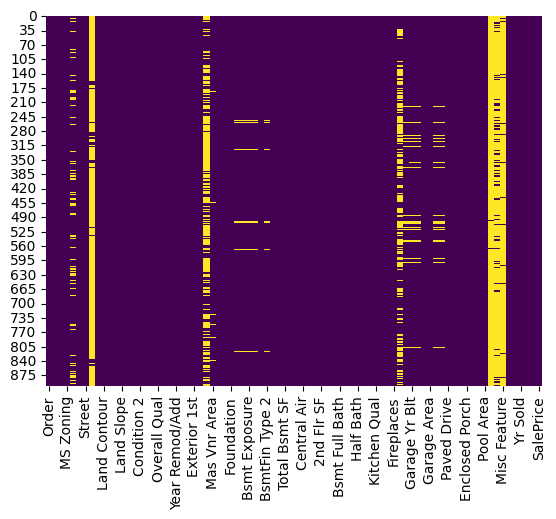

In [230]:
data_info(df)

In [303]:
orignal['3Ssn Porch'].unique()

array([  0, 168, 174, 304, 216, 407,  96, 245, 153, 120])

In [310]:
orignal['3Ssn Porch'].value_counts()

3Ssn Porch
0      889
216      2
153      2
168      1
174      1
304      1
407      1
96       1
245      1
120      1
Name: count, dtype: int64

In [313]:
continous_feat = ['Lot Frontage', 'Lot Area','Mas Vnr Area','BsmtFin SF 1','BsmtFin SF 2','Bsmt Unf SF','Total Bsmt SF','1st Flr SF','2nd Flr SF','Low Qual Fin SF', 'Gr Liv Area','Garage Area','Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch' , 'Pool Area', 'Misc Val']
for col in continous_feat:
  if orignal[col].nunique() < 50:
    print(orignal[col].value_counts())

Low Qual Fin SF
0      893
108      1
205      1
156      1
697      1
420      1
384      1
473      1
Name: count, dtype: int64
3Ssn Porch
0      889
216      2
153      2
168      1
174      1
304      1
407      1
96       1
245      1
120      1
Name: count, dtype: int64
Pool Area
0      896
144      1
480      1
576      1
555      1
Name: count, dtype: int64
Misc Val
0        867
400        7
500        3
600        3
2000       2
450        2
3000       1
480        1
15500      1
8300       1
1300       1
700        1
560        1
4500       1
650        1
1000       1
750        1
1150       1
6500       1
1500       1
1400       1
1200       1
Name: count, dtype: int64


In [306]:
orignal['Misc Val'].unique()

array([    0,   500,   750,  2000,   400,   650,   450,  1400,  1500,
        6500,  1150,   600,  1000,  4500,  3000,   560,   700,  1300,
        8300, 15500,   480,  1200])

In [301]:
orignal.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1001,527131110,120,RL,45.0,6264,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,8,5,1997,1997,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Gd,TA,PConc,Ex,TA,Mn,GLQ,656.0,Unf,0.0,1008.0,1664.0,GasA,Ex,Y,SBrkr,1682,0,0,1682,1.0,0.0,1,1,1,1,Gd,6,Min1,1,TA,Attchd,1997.0,Fin,2,528,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,247900
1,1002,527140090,120,RL,41.0,5395,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1993,1993,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,733.0,Unf,0.0,604.0,1337.0,GasA,Gd,Y,SBrkr,1337,0,0,1337,1.0,0.0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1993.0,RFn,2,462,TA,TA,Y,96,0,70,168,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,180000
2,1003,527145090,120,RL,39.0,5070,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0.0,Unf,0.0,1280.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2,506,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,8,2008,WD,Normal,180000
3,1004,527161010,60,RL,100.0,10839,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,926.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1997.0,Fin,2,470,TA,TA,Y,0,36,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,181000
4,1005,527162180,60,RL,73.0,11184,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,932.0,932.0,GasA,Gd,Y,SBrkr,932,701,0,1633,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1998.0,Fin,2,460,TA,TA,Y,0,39,0,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Family,183000


In [185]:
df['TotRms AbvGrd'].unique()

array([ 6,  5,  7,  8,  9, 11,  4, 10, 12,  3])

In [182]:

continous_feat = ['Lot Frontage', 'Lot Area','Mas Vnr Area','BsmtFin SF 1','BsmtFin SF 2','Bsmt Unf SF','Total Bsmt SF','1st Flr SF','2nd Flr SF','Low Qual Fin SF', 'Gr Liv Area','Garage Area','Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch' , 'Pool Area', 'Misc Val']
disc_feat = ['Year Built', 'Year Remod/Add', 'Bsmt Full Bath','Bsmt Half Bath', 'Full Bath', 'Half Bath','Bedroom AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Mo Sold', 'Yr Sold']
numerical_feat = continous_feat + disc_feat

ordinal_feat = ['Lot Shape', 'Utilities', 'Land Slope', 'Overall Qual', 'Overall Cond', 'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Kitchen Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating QC', 'Electrical', 'Kitchen Qual', 'Functional', 'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence']
nominal_feat = ['MS SubClass', 'MS Zoning', 'Street', 'Alley', 'Land Contour', 'Lot Config', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Foundation', 'Heating', 'Central Air', 'Garage Type', 'Misc Feature', 'Sale Type', 'Sale Condition']
cat_feat = ordinal_feat + nominal_feat

continouse --> outliers $ distribution --> log (+ve skew), z score (gauss), minmax(not gauss)

discrete --> minmax

nominal --> one-hot , label encoding

ordinal -- > label encoding

binning

missing values

In [183]:
#filling mistake nan values
values = {"Alley": 'No alley access',
          "Mas Vnr Type": 'no mas vnr',
          "Bsmt Qual": 'No Basement',
          "Bsmt Cond": 'No Basement',
          "Bsmt Exposure": 'No Basement',
          "BsmtFin Type 1": 'No Basement',
          "BsmtFin Type 2": 'No Basement',
          "Fireplace Qu": 'No Fireplace',
          "Garage Type": 'No Garage',
          "Garage Finish": 'No Garage',
          "Garage Qual": 'No Garage',
          "Garage Cond": 'No Garage',
          "Pool QC": 'No Pool',
          "Fence": 'No Fence',
          "Misc Feature": 'No Misc Feature',
          'Lot Frontage':0,
          'Mas Vnr Area':0,
          'BsmtFin SF 1':0,
          'BsmtFin SF 2':0,
          'Bsmt Unf SF':0,
          'Total Bsmt SF':0,
          'Garage Yr Blt':0}
df.fillna(value=values, inplace = True)
df.fillna(0, inplace = True)
df.drop(columns = ['Order','PID'], inplace = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MS SubClass      900 non-null    int64  
 1   MS Zoning        900 non-null    object 
 2   Lot Frontage     900 non-null    float64
 3   Lot Area         900 non-null    int64  
 4   Street           900 non-null    object 
 5   Alley            900 non-null    object 
 6   Lot Shape        900 non-null    object 
 7   Land Contour     900 non-null    object 
 8   Utilities        900 non-null    object 
 9   Lot Config       900 non-null    object 
 10  Land Slope       900 non-null    object 
 11  Neighborhood     900 non-null    object 
 12  Condition 1      900 non-null    object 
 13  Condition 2      900 non-null    object 
 14  Bldg Type        900 non-null    object 
 15  House Style      900 non-null    object 
 16  Overall Qual     900 non-null    int64  
 17  Overall Cond    

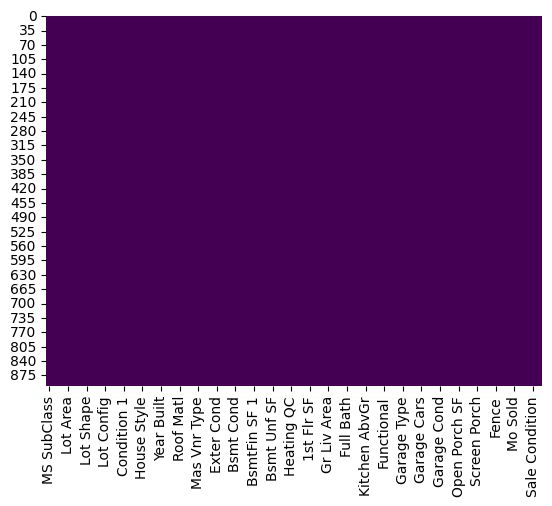

In [184]:
data_info(df)

duplicates

In [38]:
remove_duplicates(df)

nuber of duplicats =  0
assumed numbers of rows remaining =  900
number of rows after removing the duplicates =  900


outliers

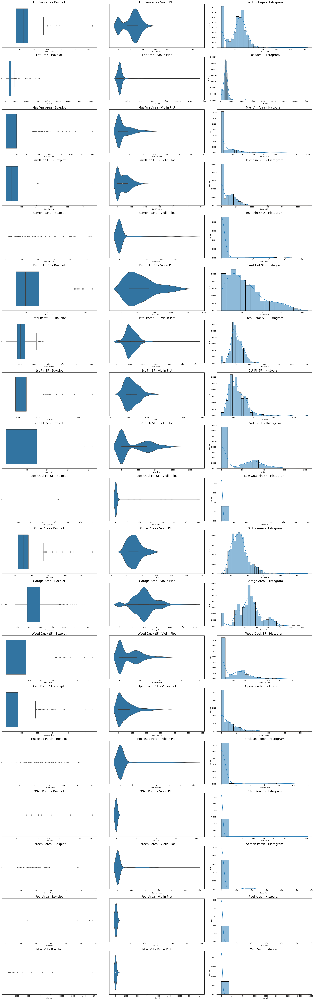

In [234]:
detect_box_voilin_hist(df, continous_feat)

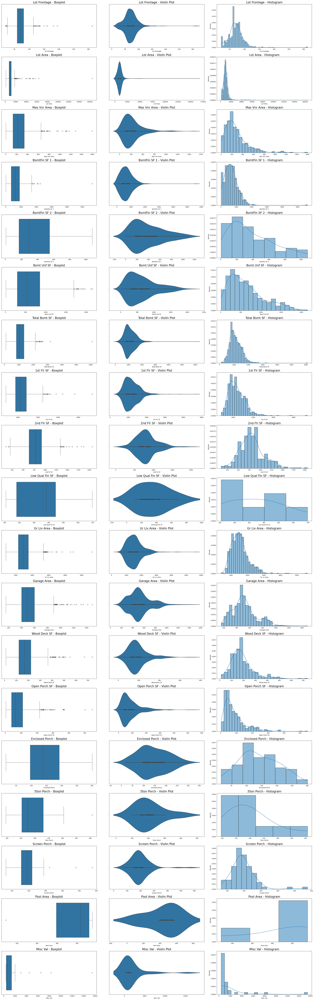

In [235]:
detect_box_voilin_hist_exclude_zeros(df,continous_feat)


 
 ------------------- Lot Frontage ------------------- 

Outliers of  Lot Frontage  from IQR method:  length:  7  -  {160.0, 195.0, 182.0, 150.0, 313.0}
before lower bound of  Lot Frontage  :  length:  0  -  set()
after upper bound of  Lot Frontage  :  length:  7  -  {160.0, 195.0, 182.0, 150.0, 313.0}


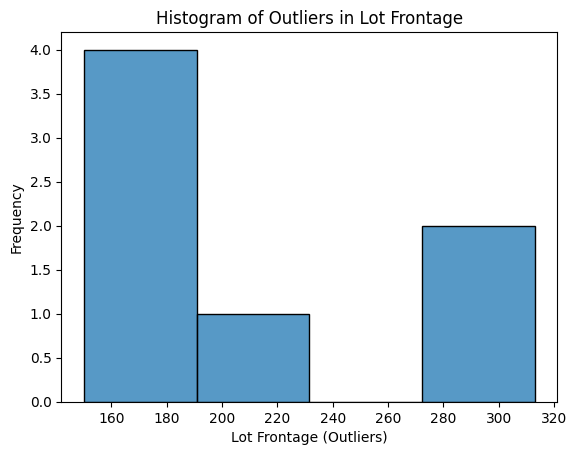


 
 ------------------- Lot Area ------------------- 

Outliers of  Lot Area  from IQR method:  length:  37  -  {41600, 27650, 51974, 63887, 21780, 150.0, 56600, 21535, 160.0, 45600, 47007, 21286, 20270, 47280, 23730, 19508, 164660, 182.0, 313.0, 20544, 39104, 19522, 195.0, 18890, 18386, 18265, 26073, 19550, 53227, 18160, 22002, 31220, 21750, 24572, 18559}
before lower bound of  Lot Area  :  length:  0  -  set()
after upper bound of  Lot Area  :  length:  37  -  {41600, 27650, 51974, 63887, 21780, 150.0, 56600, 21535, 160.0, 45600, 47007, 21286, 20270, 47280, 23730, 19508, 164660, 182.0, 313.0, 20544, 39104, 19522, 195.0, 18890, 18386, 18265, 26073, 19550, 53227, 18160, 22002, 31220, 21750, 24572, 18559}


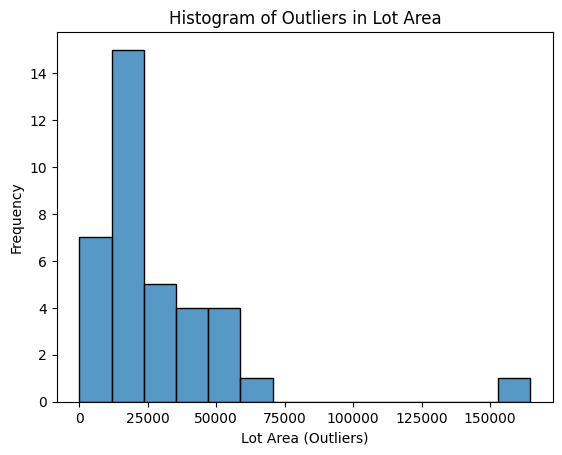


 
 ------------------- Mas Vnr Area ------------------- 

Outliers of  Mas Vnr Area  from IQR method:  length:  88  -  {513.0, 27650, 515.0, 525.0, 526.0, 1050.0, 21535, 45600, 549.0, 554.0, 19508, 564.0, 567.0, 568.0, 20544, 1600.0, 19522, 594.0, 1110.0, 600.0, 1115.0, 604.0, 19550, 616.0, 1129.0, 621.0, 632.0, 18559, 41600, 647.0, 651.0, 1170.0, 660.0, 150.0, 664.0, 668.0, 160.0, 674.0, 680.0, 47280, 23730, 182.0, 39104, 705.0, 195.0, 710.0, 714.0, 18160, 754.0, 21750, 766.0, 768.0, 772.0, 51974, 1290.0, 21780, 56600, 796.0, 21286, 20270, 816.0, 164660, 313.0, 18265, 63887, 47007, 945.0, 18890, 970.0, 18386, 26073, 53227, 491.0, 492.0, 495.0, 22002, 31220, 502.0, 504.0, 24572, 510.0}
before lower bound of  Mas Vnr Area  :  length:  0  -  set()
after upper bound of  Mas Vnr Area  :  length:  88  -  {513.0, 27650, 515.0, 525.0, 526.0, 1050.0, 21535, 45600, 549.0, 554.0, 19508, 564.0, 567.0, 568.0, 20544, 1600.0, 19522, 594.0, 1110.0, 600.0, 1115.0, 604.0, 19550, 616.0, 1129.0, 621.0, 

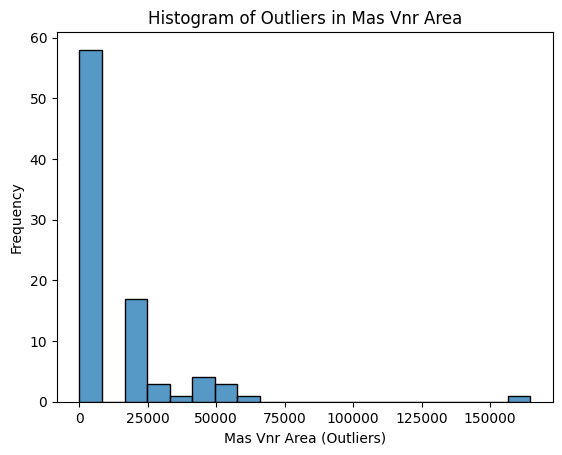


 
 ------------------- BsmtFin SF 1 ------------------- 

Outliers of  BsmtFin SF 1  from IQR method:  length:  92  -  {513.0, 27650, 515.0, 5644.0, 525.0, 526.0, 1050.0, 21535, 45600, 549.0, 2085.0, 554.0, 2096.0, 19508, 564.0, 567.0, 568.0, 20544, 1600.0, 19522, 594.0, 1110.0, 600.0, 1115.0, 604.0, 19550, 616.0, 1129.0, 621.0, 632.0, 18559, 41600, 647.0, 651.0, 1170.0, 660.0, 150.0, 664.0, 668.0, 160.0, 674.0, 680.0, 47280, 23730, 182.0, 39104, 705.0, 195.0, 710.0, 714.0, 2257.0, 18160, 754.0, 21750, 766.0, 768.0, 772.0, 51974, 1290.0, 21780, 56600, 796.0, 21286, 20270, 816.0, 164660, 313.0, 18265, 63887, 47007, 945.0, 18890, 970.0, 18386, 26073, 53227, 491.0, 492.0, 495.0, 22002, 31220, 502.0, 504.0, 24572, 510.0}
before lower bound of  BsmtFin SF 1  :  length:  0  -  set()
after upper bound of  BsmtFin SF 1  :  length:  92  -  {513.0, 27650, 515.0, 5644.0, 525.0, 526.0, 1050.0, 21535, 45600, 549.0, 2085.0, 554.0, 2096.0, 19508, 564.0, 567.0, 568.0, 20544, 1600.0, 19522, 594.0, 111

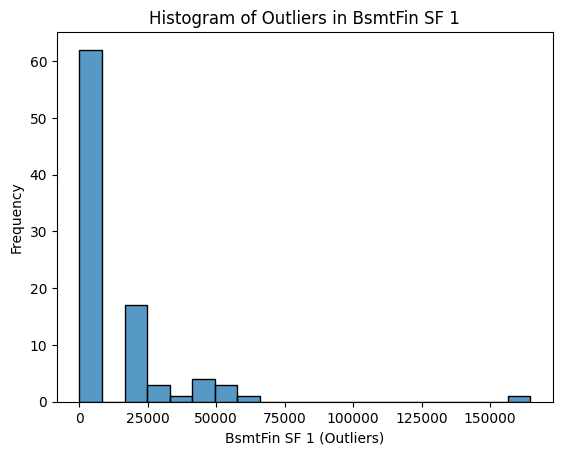


 
 ------------------- BsmtFin SF 2 ------------------- 

Outliers of  BsmtFin SF 2  from IQR method:  length:  195  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 80.0, 594.0, 596.0, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 670.0, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 175.0, 47280, 176.0, 23730, 180.0, 181.0, 182.0, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 710.0, 714.0, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0, 228.0, 18160, 240.0, 754.0, 21750, 247.0, 766.0, 768.0, 772.0, 51974, 264.0, 1290.0, 273.0, 21780, 279.0, 56600, 796.0, 287.0, 799.0, 

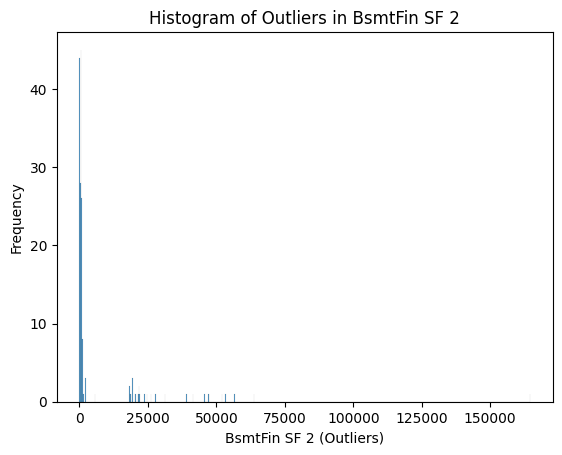


 
 ------------------- Bsmt Unf SF ------------------- 

Outliers of  Bsmt Unf SF  from IQR method:  length:  211  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 80.0, 594.0, 596.0, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 670.0, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 175.0, 47280, 176.0, 23730, 180.0, 181.0, 182.0, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 714.0, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0, 228.0, 1765.0, 1774.0, 18160, 240.0, 754.0, 1777.0, 21750, 247.0, 766.0, 768.0, 1795.0, 772.0, 5

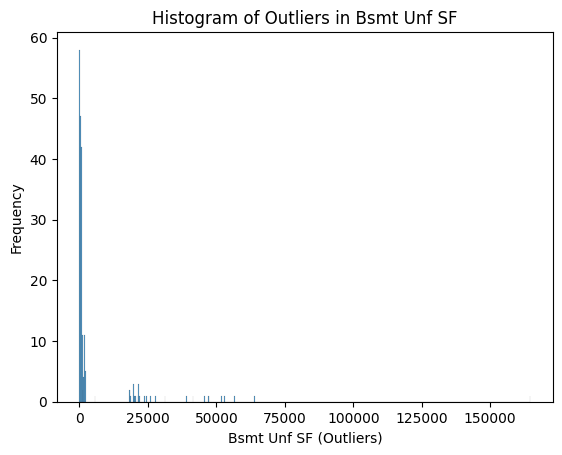


 
 ------------------- Total Bsmt SF ------------------- 

Outliers of  Total Bsmt SF  from IQR method:  length:  226  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 2633.0, 80.0, 594.0, 596.0, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 3200.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 670.0, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 714.0, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0, 2271.0, 228.0, 1765.0, 1774.0, 18160

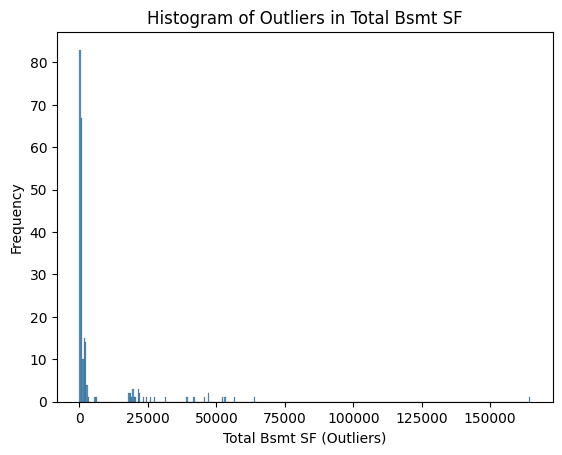


 
 ------------------- 1st Flr SF ------------------- 

Outliers of  1st Flr SF  from IQR method:  length:  241  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 2633.0, 80.0, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 3200.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 3228, 670.0, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 714.0, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0, 2271.0, 228.0, 1765.0, 2276, 3

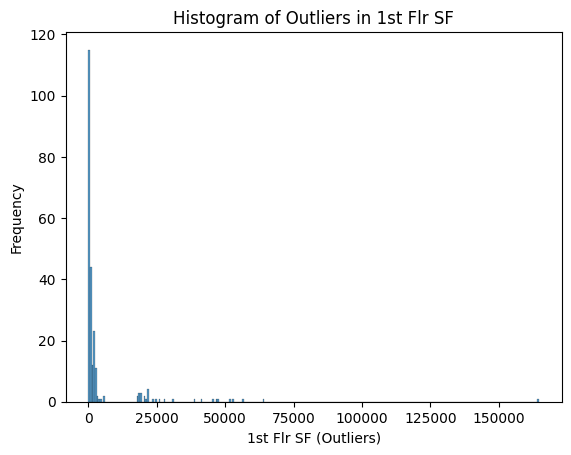


 
 ------------------- 2nd Flr SF ------------------- 

Outliers of  2nd Flr SF  from IQR method:  length:  243  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 2065, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 2633.0, 80.0, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 3200.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 3228, 670.0, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 714.0, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0, 2271.0, 228.0, 1765.0, 2

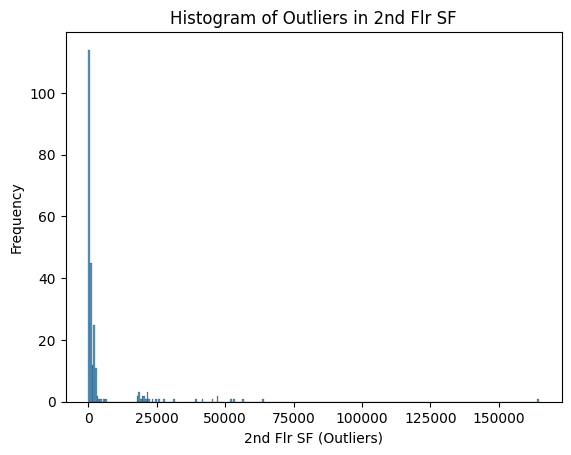


 
 ------------------- Low Qual Fin SF ------------------- 

Outliers of  Low Qual Fin SF  from IQR method:  length:  250  -  {513.0, 27650, 515.0, 6.0, 1031.0, 5644.0, 525.0, 526.0, 1037.0, 2065, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 2633.0, 80.0, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 3200.0, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 668.0, 3228, 670.0, 156, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 697, 186.0, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 714.0, 205, 206.0, 208.0, 2257.0, 211.0, 723.0, 219.0,

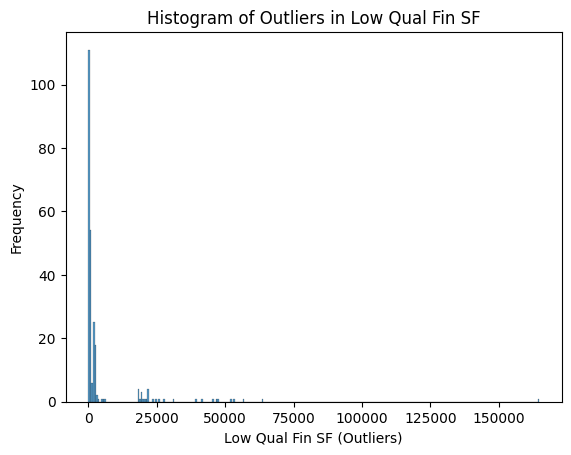


 
 ------------------- Gr Liv Area ------------------- 

Outliers of  Gr Liv Area  from IQR method:  length:  275  -  {513.0, 27650, 515.0, 6.0, 1031.0, 3078, 5642, 5644.0, 525.0, 526.0, 1037.0, 2065, 531.0, 532.0, 1050.0, 539.0, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 2121.0, 2633.0, 80.0, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 18559, 41600, 128.0, 3200.0, 2690, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 664.0, 153.0, 2713, 2715, 668.0, 3228, 670.0, 156, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 697, 186.0, 2748, 39104, 705.0, 193.0, 195.0, 196.0, 1728.0, 710.0, 2758, 714.0, 205, 206.0, 2

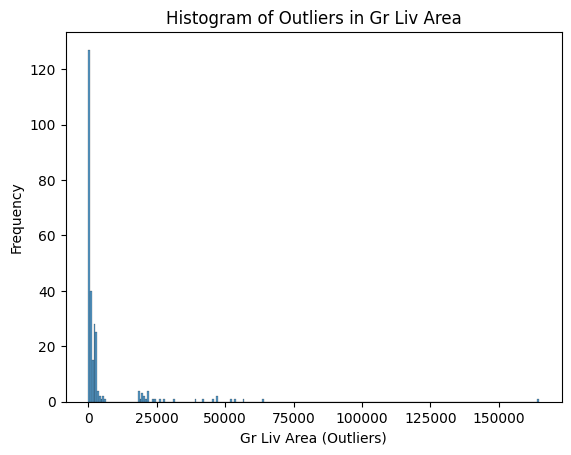


 
 ------------------- Garage Area ------------------- 

Outliers of  Garage Area  from IQR method:  length:  349  -  {0, 513.0, 27650, 515.0, 1025, 6.0, 1031.0, 3078, 5642, 5644.0, 525.0, 526.0, 1037.0, 1040, 2065, 531.0, 532.0, 1050.0, 539.0, 1052, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 1092, 2121.0, 2633.0, 80.0, 1105, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 1150, 18559, 41600, 128.0, 3200.0, 2690, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 1174, 664.0, 153.0, 2713, 2715, 668.0, 3228, 670.0, 156, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 697, 186.0, 2748, 39104, 705.0, 193.0, 195.0, 196

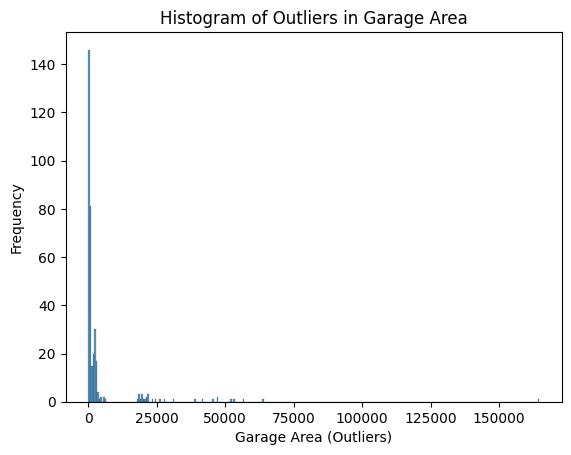


 
 ------------------- Wood Deck SF ------------------- 

Outliers of  Wood Deck SF  from IQR method:  length:  365  -  {0, 513.0, 27650, 515.0, 1025, 6.0, 1031.0, 3078, 5642, 5644.0, 525.0, 526.0, 1037.0, 1040, 2065, 531.0, 532.0, 1050.0, 539.0, 1052, 21535, 45600, 543.0, 35.0, 549.0, 2085.0, 38.0, 40.0, 41.0, 554.0, 555.0, 1063.0, 2552.0, 550, 2096.0, 48.0, 19508, 564.0, 52.0, 567.0, 568.0, 1080.0, 60.0, 20544, 1600.0, 19522, 64.0, 580.0, 1092, 2121.0, 2633.0, 80.0, 1105, 594.0, 596.0, 4692, 1110.0, 600.0, 1115.0, 604.0, 93.0, 19550, 606.0, 608.0, 612.0, 613.0, 2660.0, 616.0, 1129.0, 106.0, 619.0, 108.0, 621.0, 110.0, 2153.0, 632.0, 120.0, 121.0, 125.0, 1150, 18559, 41600, 128.0, 3200.0, 2690, 645.0, 647.0, 651.0, 139.0, 1170.0, 147.0, 660.0, 150.0, 1174, 664.0, 153.0, 2713, 2715, 668.0, 3228, 670.0, 156, 160.0, 674.0, 162.0, 167.0, 680.0, 169.0, 679.0, 1704.0, 1706.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 23730, 2223.0, 180.0, 181.0, 182.0, 697, 186.0, 2748, 39104, 705.0, 193.0, 195

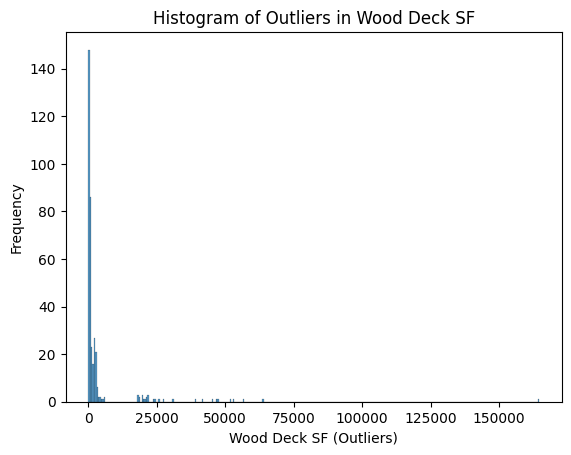


 
 ------------------- Open Porch SF ------------------- 

Outliers of  Open Porch SF  from IQR method:  length:  418  -  {0, 6.0, 2065, 35.0, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 60.0, 20544, 64.0, 2121.0, 80.0, 93.0, 2153.0, 106.0, 108.0, 110.0, 120.0, 121.0, 125.0, 18559, 128.0, 139.0, 147.0, 150.0, 153.0, 156, 160.0, 162.0, 167.0, 169.0, 2217.0, 2220.0, 175.0, 47280, 176.0, 2223.0, 180.0, 181.0, 182.0, 186.0, 189, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 200, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 213, 214, 216, 217, 219.0, 4316, 2271.0, 224, 228.0, 2276, 230, 235, 236, 238, 240.0, 241, 2290, 243, 247.0, 251, 256, 264.0, 265, 2320.0, 273.0, 276, 279.0, 282, 285, 287.0, 290.0, 2338, 291, 292, 294.0, 299, 304, 306.0, 308.0, 312, 313.0, 2362, 319.0, 336.0, 2396.0, 351.0, 2411, 364, 365, 368, 2418.0, 372, 374.0, 380.0, 4476, 382.0, 384, 391.0, 2444.0, 63887, 400.0, 2461.0, 2464, 420, 2470, 424, 426, 428, 431, 435.0, 438.0, 449.0, 2497, 455, 456.0, 18890, 460,

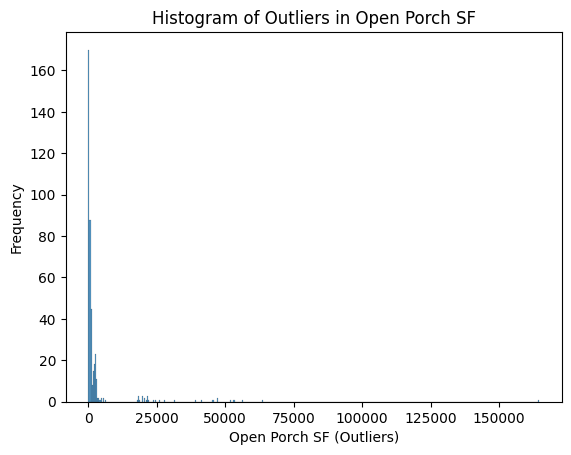


 
 ------------------- Enclosed Porch ------------------- 

Outliers of  Enclosed Porch  from IQR method:  length:  531  -  {0, 6.0, 16, 2065, 20, 30, 34, 35.0, 36, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 55, 60.0, 20544, 64.0, 66, 68, 70, 2121.0, 80.0, 84, 87, 90, 92, 93.0, 96, 99, 100, 101, 102, 2153.0, 106.0, 108.0, 109, 110.0, 112, 116, 117, 120.0, 121.0, 122, 123, 125.0, 126, 18559, 128.0, 134, 137, 138, 139.0, 140, 144, 145, 147.0, 148, 150.0, 153.0, 154, 156, 160.0, 162.0, 164, 165, 167.0, 169.0, 2217.0, 2220.0, 172, 174, 175.0, 47280, 176.0, 2223.0, 180.0, 181.0, 182.0, 183, 185, 186.0, 189, 190, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 200, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 212, 213, 214, 216, 217, 218, 219.0, 4316, 2271.0, 224, 228.0, 2276, 230, 231, 235, 236, 238, 239, 240.0, 241, 2290, 243, 246, 247.0, 248, 249, 251, 252, 254, 256, 259, 264.0, 265, 2320.0, 273.0, 276, 279.0, 280, 282, 285, 287.0, 290.0, 2338, 291, 292, 294.0, 299, 301, 304, 306.

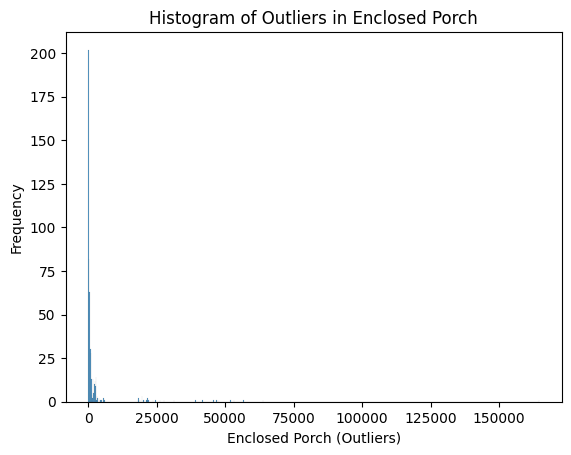


 
 ------------------- 3Ssn Porch ------------------- 

Outliers of  3Ssn Porch  from IQR method:  length:  542  -  {0, 6.0, 16, 2065, 20, 30, 34, 35.0, 36, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 55, 60.0, 20544, 64.0, 66, 68, 70, 2121.0, 80.0, 84, 87, 90, 92, 93.0, 96, 99, 100, 101, 102, 2153.0, 106.0, 108.0, 109, 110.0, 112, 116, 117, 120.0, 121.0, 122, 123, 125.0, 126, 18559, 128.0, 134, 137, 138, 139.0, 140, 144, 145, 147.0, 148, 150.0, 153.0, 154, 156, 160.0, 162.0, 164, 165, 167.0, 168, 169.0, 2217.0, 2220.0, 172, 174, 175.0, 47280, 176.0, 2223.0, 180.0, 181.0, 182.0, 183, 185, 186.0, 189, 190, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 200, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 212, 213, 214, 216, 217, 218, 219.0, 4316, 2271.0, 224, 228.0, 2276, 230, 231, 235, 236, 238, 239, 240.0, 241, 2290, 243, 245, 246, 247.0, 248, 249, 251, 252, 254, 256, 259, 264.0, 265, 2320.0, 273.0, 276, 279.0, 280, 282, 285, 287.0, 290.0, 2338, 291, 292, 294.0, 299, 301, 304, 30

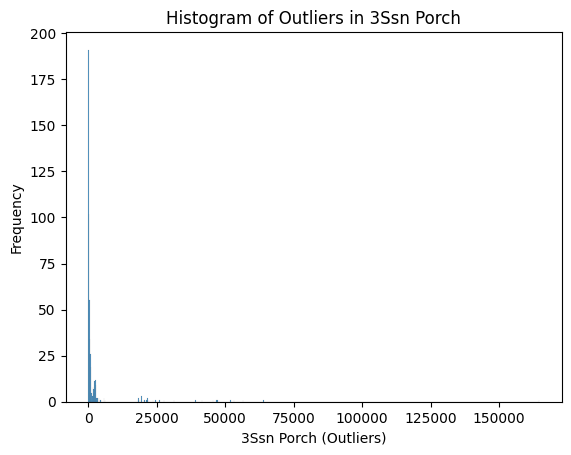


 
 ------------------- Screen Porch ------------------- 

Outliers of  Screen Porch  from IQR method:  length:  616  -  {0, 6.0, 16, 2065, 20, 30, 34, 35.0, 36, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 55, 60.0, 20544, 64.0, 66, 68, 70, 2121.0, 80.0, 84, 87, 90, 92, 93.0, 94, 95, 96, 99, 100, 101, 102, 2153.0, 106.0, 108.0, 109, 110.0, 112, 116, 117, 120.0, 121.0, 122, 123, 125.0, 126, 18559, 128.0, 130, 134, 135, 137, 138, 139.0, 140, 141, 142, 144, 145, 147.0, 148, 150.0, 153.0, 154, 155, 156, 160.0, 161, 162.0, 163, 164, 165, 167.0, 168, 169.0, 2217.0, 171, 2220.0, 172, 174, 175.0, 47280, 176.0, 2223.0, 178, 180.0, 181.0, 182.0, 183, 185, 186.0, 189, 190, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 198, 200, 201, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 212, 213, 214, 216, 217, 218, 219.0, 4316, 220, 221, 2271.0, 224, 227, 228.0, 2276, 230, 231, 235, 236, 238, 239, 240.0, 241, 2290, 243, 245, 246, 247.0, 248, 249, 251, 252, 254, 255, 256, 259, 260, 264.0, 265, 266,

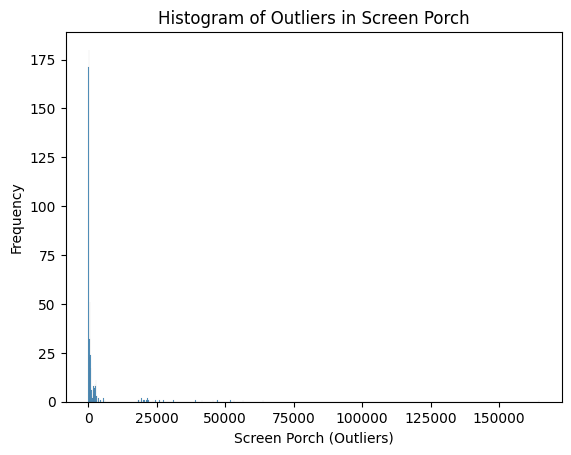


 
 ------------------- Pool Area ------------------- 

Outliers of  Pool Area  from IQR method:  length:  620  -  {0, 6.0, 16, 2065, 20, 30, 34, 35.0, 36, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 55, 60.0, 20544, 64.0, 66, 68, 70, 2121.0, 80.0, 84, 87, 90, 92, 93.0, 94, 95, 96, 99, 100, 101, 102, 2153.0, 106.0, 108.0, 109, 110.0, 112, 116, 117, 120.0, 121.0, 122, 123, 125.0, 126, 18559, 128.0, 130, 134, 135, 137, 138, 139.0, 140, 141, 142, 144, 145, 147.0, 148, 150.0, 153.0, 154, 155, 156, 160.0, 161, 162.0, 163, 164, 165, 167.0, 168, 169.0, 2217.0, 171, 2220.0, 172, 174, 175.0, 47280, 176.0, 2223.0, 178, 180.0, 181.0, 182.0, 183, 185, 186.0, 189, 190, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 198, 200, 201, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 212, 213, 214, 216, 217, 218, 219.0, 4316, 220, 221, 2271.0, 224, 227, 228.0, 2276, 230, 231, 235, 236, 238, 239, 240.0, 241, 2290, 243, 245, 246, 247.0, 248, 249, 251, 252, 254, 255, 256, 259, 260, 264.0, 265, 266, 2320.

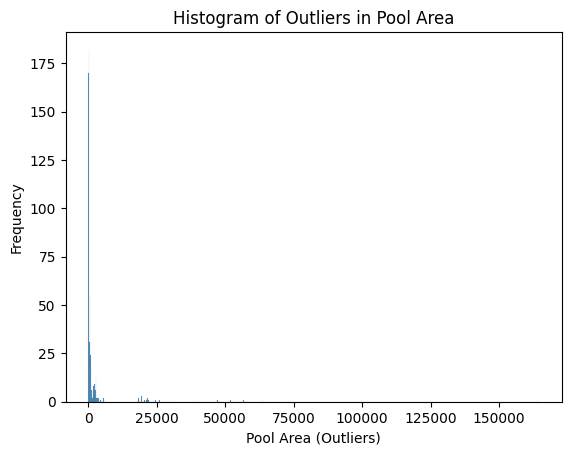


 
 ------------------- Misc Val ------------------- 

Outliers of  Misc Val  from IQR method:  length:  653  -  {0, 6.0, 16, 2065, 20, 30, 34, 35.0, 36, 2085.0, 38.0, 40.0, 41.0, 2096.0, 48.0, 52.0, 55, 60.0, 20544, 64.0, 66, 68, 70, 2121.0, 80.0, 84, 87, 90, 92, 93.0, 94, 95, 96, 99, 100, 101, 102, 2153.0, 106.0, 108.0, 109, 110.0, 8300, 112, 116, 117, 120.0, 121.0, 122, 123, 125.0, 126, 18559, 128.0, 130, 134, 135, 137, 138, 139.0, 140, 141, 142, 144, 145, 147.0, 148, 150.0, 153.0, 154, 155, 156, 160.0, 161, 162.0, 163, 164, 165, 167.0, 168, 169.0, 2217.0, 171, 2220.0, 172, 174, 175.0, 47280, 176.0, 2223.0, 178, 180.0, 181.0, 182.0, 183, 185, 186.0, 189, 190, 191, 39104, 193.0, 192, 195.0, 196.0, 194, 198, 200, 201, 203, 204, 205, 206.0, 207, 208.0, 2257.0, 210, 211.0, 212, 213, 214, 216, 217, 218, 219.0, 4316, 220, 221, 2271.0, 224, 227, 228.0, 2276, 230, 231, 235, 236, 238, 239, 240.0, 241, 2290, 243, 245, 246, 247.0, 248, 249, 251, 252, 254, 255, 256, 259, 260, 264.0, 265, 266, 2

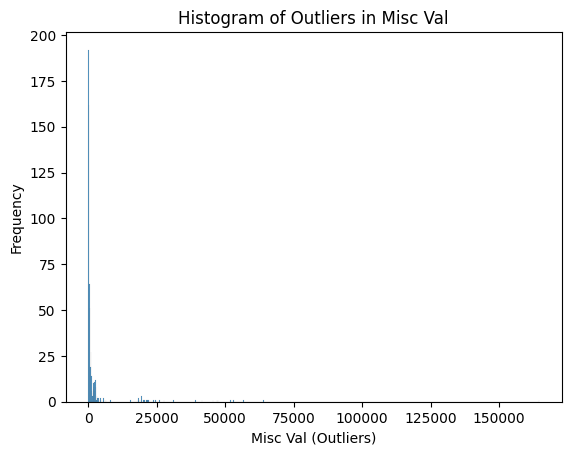

In [236]:
detect_outliers_iqr(df,continous_feat)


 
 ------------------- Lot Frontage ------------------- 

Outliers of Lot Frontage from IQR method:  length: 52  -  {128.0, 130.0, 134.0, 135.0, 136.0, 21.0, 22.0, 150.0, 24.0, 160.0, 182.0, 313.0, 195.0, 115.0, 116.0, 118.0, 120.0, 123.0, 124.0}
before lower bound of Lot Frontage : length: 32  -  {24.0, 21.0, 22.0}
after upper bound of Lot Frontage : length: 20  -  {128.0, 160.0, 130.0, 195.0, 134.0, 135.0, 136.0, 313.0, 115.0, 116.0, 118.0, 150.0, 120.0, 182.0, 123.0, 124.0}


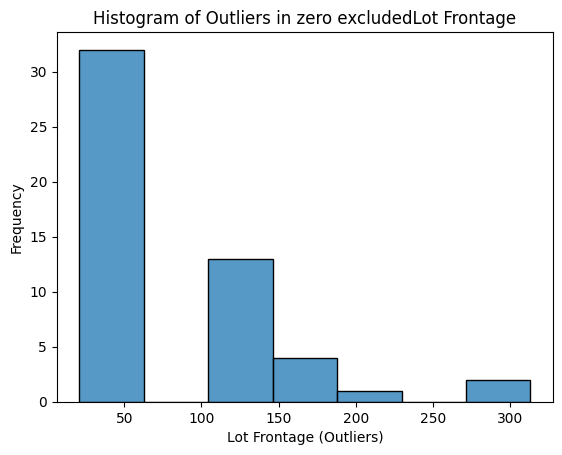


 
 ------------------- Lot Area ------------------- 

Outliers of Lot Area from IQR method:  length: 30  -  {41600, 27650, 51974, 63887, 21780, 56600, 21535, 45600, 47007, 21286, 20270, 47280, 23730, 19508, 164660, 20544, 39104, 19522, 18890, 18386, 26073, 18265, 19550, 53227, 18160, 22002, 31220, 21750, 24572, 18559}
before lower bound of Lot Area : length: 0  -  set()
after upper bound of Lot Area : length: 30  -  {41600, 27650, 51974, 63887, 21780, 56600, 21535, 45600, 47007, 21286, 20270, 47280, 23730, 19508, 164660, 20544, 39104, 19522, 18890, 18386, 26073, 18265, 19550, 53227, 18160, 22002, 31220, 21750, 24572, 18559}


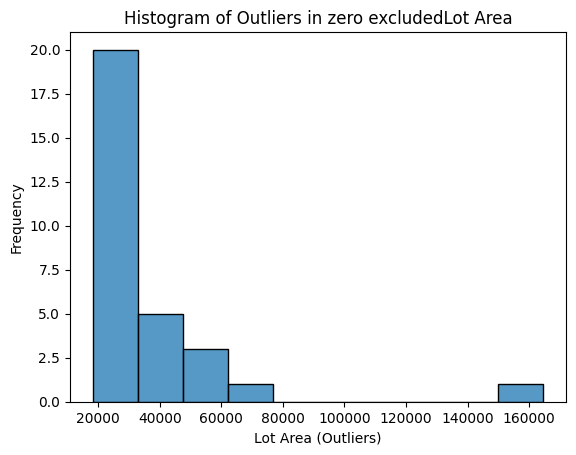


 
 ------------------- Mas Vnr Area ------------------- 

Outliers of Mas Vnr Area from IQR method:  length: 24  -  {768.0, 772.0, 1290.0, 1170.0, 660.0, 664.0, 1050.0, 796.0, 668.0, 674.0, 680.0, 816.0, 945.0, 1600.0, 705.0, 710.0, 714.0, 970.0, 1110.0, 1115.0, 1129.0, 754.0, 766.0}
before lower bound of Mas Vnr Area : length: 0  -  set()
after upper bound of Mas Vnr Area : length: 24  -  {768.0, 772.0, 1290.0, 1170.0, 660.0, 664.0, 1050.0, 796.0, 668.0, 674.0, 680.0, 816.0, 945.0, 1600.0, 705.0, 710.0, 714.0, 970.0, 1110.0, 1115.0, 1129.0, 754.0, 766.0}


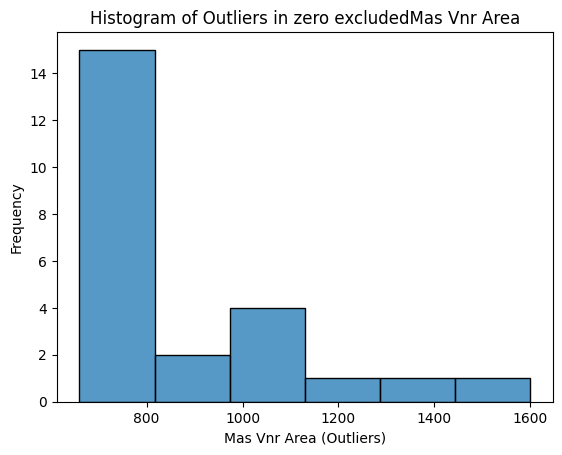


 
 ------------------- BsmtFin SF 1 ------------------- 

Outliers of BsmtFin SF 1 from IQR method:  length: 8  -  {1728.0, 1732.0, 2085.0, 5644.0, 2096.0, 2257.0, 1812.0, 1880.0}
before lower bound of BsmtFin SF 1 : length: 0  -  set()
after upper bound of BsmtFin SF 1 : length: 8  -  {1728.0, 1732.0, 2085.0, 5644.0, 2096.0, 2257.0, 1812.0, 1880.0}


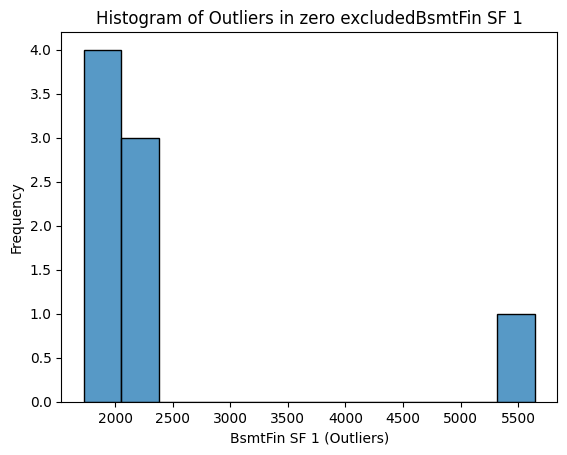


 
 ------------------- BsmtFin SF 2 ------------------- 

Outliers of BsmtFin SF 2 from IQR method:  length: 0  -  set()
before lower bound of BsmtFin SF 2 : length: 0  -  set()
after upper bound of BsmtFin SF 2 : length: 0  -  set()

 
 ------------------- Bsmt Unf SF ------------------- 

Outliers of Bsmt Unf SF from IQR method:  length: 16  -  {1728.0, 1824.0, 1795.0, 1765.0, 1704.0, 1800.0, 1706.0, 1802.0, 2121.0, 1869.0, 1774.0, 1935.0, 2153.0, 1777.0, 1905.0, 1969.0}
before lower bound of Bsmt Unf SF : length: 0  -  set()
after upper bound of Bsmt Unf SF : length: 16  -  {1728.0, 1824.0, 1795.0, 1765.0, 1704.0, 1800.0, 1706.0, 1802.0, 2121.0, 1869.0, 1774.0, 1935.0, 2153.0, 1777.0, 1905.0, 1969.0}


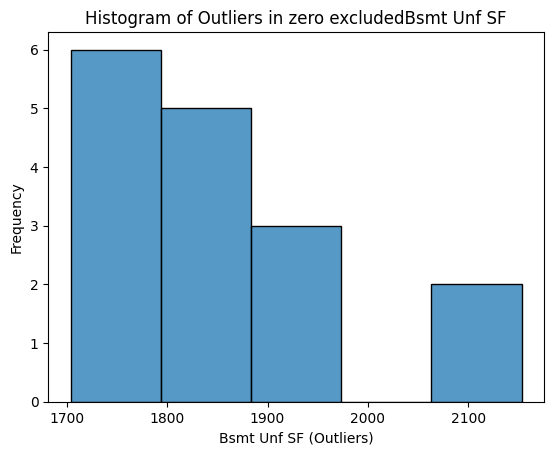


 
 ------------------- Total Bsmt SF ------------------- 

Outliers of Total Bsmt SF from IQR method:  length: 15  -  {3200.0, 2660.0, 2535.0, 2217.0, 2633.0, 2220.0, 2444.0, 2223.0, 2320.0, 2418.0, 2552.0, 2396.0, 2461.0, 6110.0, 2271.0}
before lower bound of Total Bsmt SF : length: 0  -  set()
after upper bound of Total Bsmt SF : length: 15  -  {3200.0, 2660.0, 2535.0, 2217.0, 2633.0, 2220.0, 2444.0, 2223.0, 2320.0, 2418.0, 2552.0, 2396.0, 2461.0, 6110.0, 2271.0}


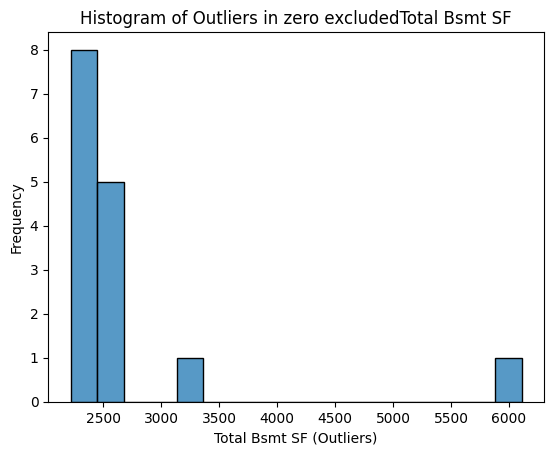


 
 ------------------- 1st Flr SF ------------------- 

Outliers of 1st Flr SF from IQR method:  length: 15  -  {2464, 2497, 2338, 2276, 2470, 2633, 2411, 2444, 3820, 2290, 2898, 4692, 2552, 2362, 3228}
before lower bound of 1st Flr SF : length: 0  -  set()
after upper bound of 1st Flr SF : length: 15  -  {2464, 2497, 2338, 2276, 2470, 2633, 2411, 2444, 3820, 2290, 2898, 4692, 2552, 2362, 3228}


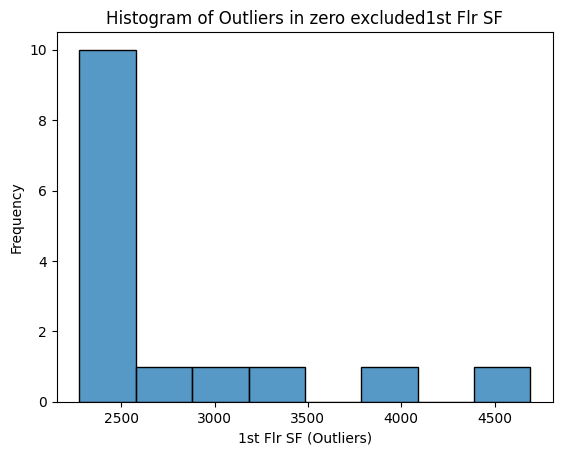


 
 ------------------- 2nd Flr SF ------------------- 

Outliers of 2nd Flr SF from IQR method:  length: 18  -  {1345, 1377, 1540, 167, 1479, 1611, 1420, 1357, 110, 1402, 1872, 2065, 1426, 182, 1721, 1370, 1818, 1407}
before lower bound of 2nd Flr SF : length: 3  -  {182, 110, 167}
after upper bound of 2nd Flr SF : length: 15  -  {1345, 1377, 1540, 1479, 1611, 1420, 1357, 1402, 1872, 2065, 1426, 1721, 1370, 1818, 1407}


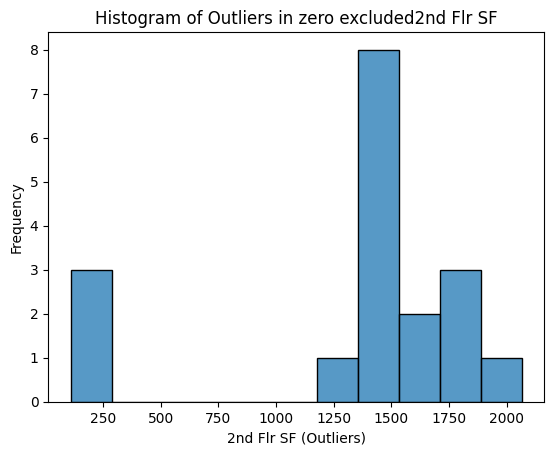


 
 ------------------- Low Qual Fin SF ------------------- 

Outliers of Low Qual Fin SF from IQR method:  length: 0  -  set()
before lower bound of Low Qual Fin SF : length: 0  -  set()
after upper bound of Low Qual Fin SF : length: 0  -  set()

 
 ------------------- Gr Liv Area ------------------- 

Outliers of Gr Liv Area from IQR method:  length: 25  -  {2944, 2690, 3078, 5642, 2956, 2840, 2713, 2715, 3228, 3493, 2872, 2748, 2758, 2898, 2775, 4316, 2786, 2790, 2792, 3820, 3447, 2810, 4476, 2814}
before lower bound of Gr Liv Area : length: 0  -  set()
after upper bound of Gr Liv Area : length: 25  -  {2944, 2690, 3078, 5642, 2956, 2840, 2713, 2715, 3228, 3493, 2872, 2748, 2758, 2898, 2775, 4316, 2786, 2790, 2792, 3820, 3447, 2810, 4476, 2814}


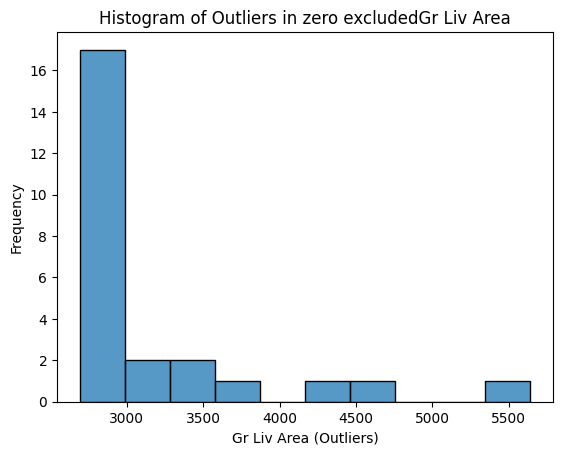


 
 ------------------- Garage Area ------------------- 

Outliers of Garage Area from IQR method:  length: 35  -  {1025, 905, 1418, 908, 912, 1040, 916, 1174, 924, 925, 1052, 928, 1314, 932, 933, 936, 938, 944, 947, 954, 1092, 1220, 1348, 1488, 1105, 1110, 983, 1248, 1003, 1014, 1150}
before lower bound of Garage Area : length: 0  -  set()
after upper bound of Garage Area : length: 35  -  {1025, 905, 1418, 908, 912, 1040, 916, 1174, 924, 925, 1052, 928, 1314, 932, 933, 936, 938, 944, 947, 954, 1092, 1220, 1348, 1488, 1105, 1110, 983, 1248, 1003, 1014, 1150}


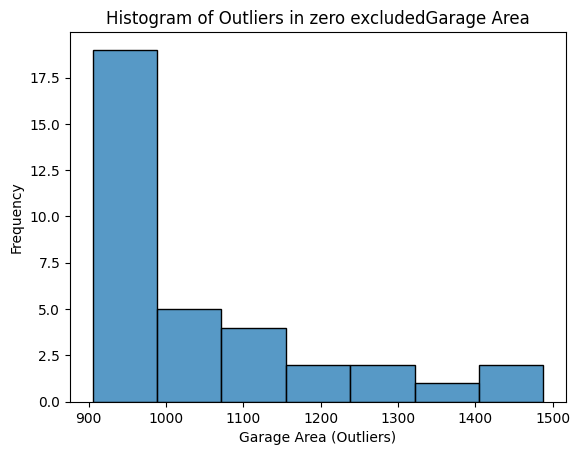


 
 ------------------- Wood Deck SF ------------------- 

Outliers of Wood Deck SF from IQR method:  length: 27  -  {385, 390, 400, 402, 403, 407, 409, 411, 414, 670, 418, 550, 424, 426, 428, 431, 455, 460, 467, 736, 486, 490, 495, 500, 382, 511}
before lower bound of Wood Deck SF : length: 0  -  set()
after upper bound of Wood Deck SF : length: 27  -  {385, 390, 400, 402, 403, 407, 409, 411, 414, 670, 418, 550, 424, 426, 428, 431, 455, 460, 467, 736, 486, 490, 495, 500, 382, 511}


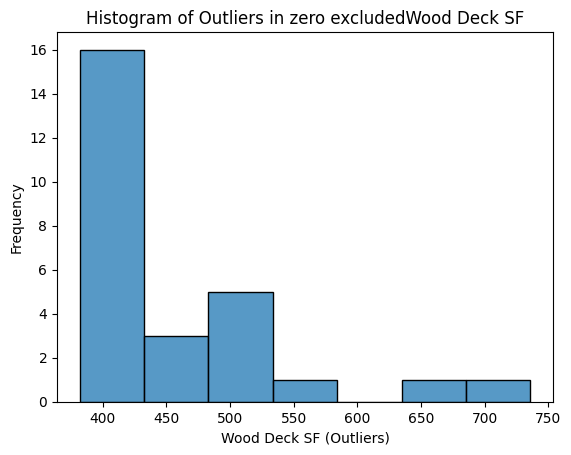


 
 ------------------- Open Porch SF ------------------- 

Outliers of Open Porch SF from IQR method:  length: 31  -  {256, 265, 276, 282, 285, 291, 292, 547, 299, 304, 312, 217, 224, 228, 230, 235, 236, 364, 238, 365, 240, 241, 368, 243, 372, 502, 251}
before lower bound of Open Porch SF : length: 0  -  set()
after upper bound of Open Porch SF : length: 31  -  {256, 265, 276, 282, 285, 291, 292, 547, 299, 304, 312, 217, 224, 228, 230, 235, 236, 364, 238, 365, 240, 241, 368, 243, 372, 502, 251}


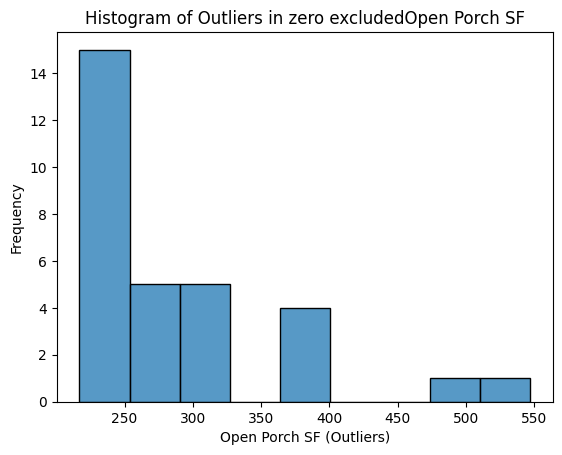


 
 ------------------- Enclosed Porch ------------------- 

Outliers of Enclosed Porch from IQR method:  length: 0  -  set()
before lower bound of Enclosed Porch : length: 0  -  set()
after upper bound of Enclosed Porch : length: 0  -  set()

 
 ------------------- 3Ssn Porch ------------------- 

Outliers of 3Ssn Porch from IQR method:  length: 1  -  {407}
before lower bound of 3Ssn Porch : length: 0  -  set()
after upper bound of 3Ssn Porch : length: 1  -  {407}


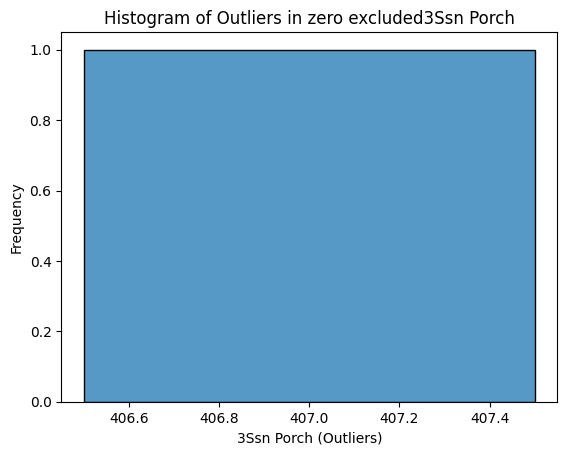


 
 ------------------- Screen Porch ------------------- 

Outliers of Screen Porch from IQR method:  length: 3  -  {480, 322, 576}
before lower bound of Screen Porch : length: 0  -  set()
after upper bound of Screen Porch : length: 3  -  {480, 322, 576}


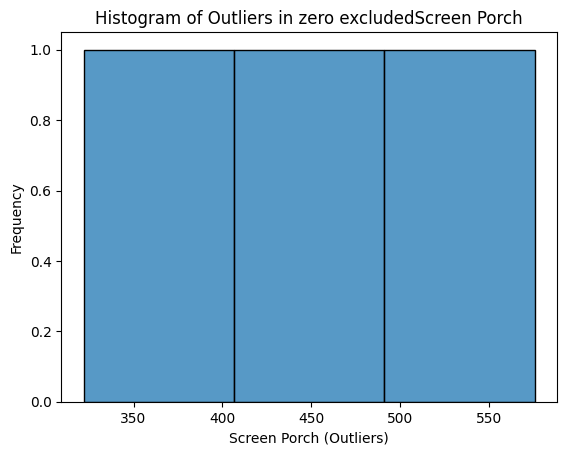


 
 ------------------- Pool Area ------------------- 

Outliers of Pool Area from IQR method:  length: 1  -  {144}
before lower bound of Pool Area : length: 1  -  {144}
after upper bound of Pool Area : length: 0  -  set()


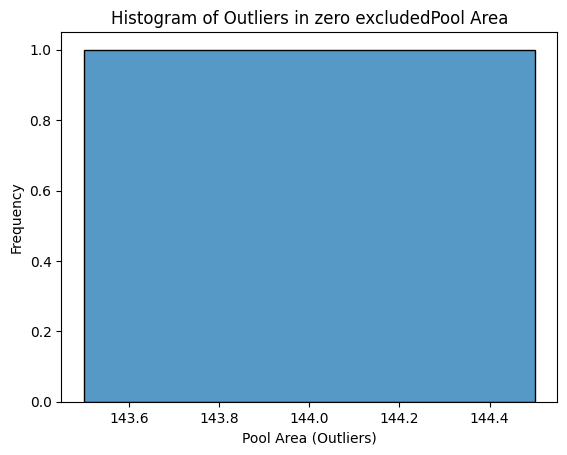


 
 ------------------- Misc Val ------------------- 

Outliers of Misc Val from IQR method:  length: 5  -  {6500, 8300, 15500, 4500, 3000}
before lower bound of Misc Val : length: 0  -  set()
after upper bound of Misc Val : length: 5  -  {6500, 8300, 15500, 4500, 3000}


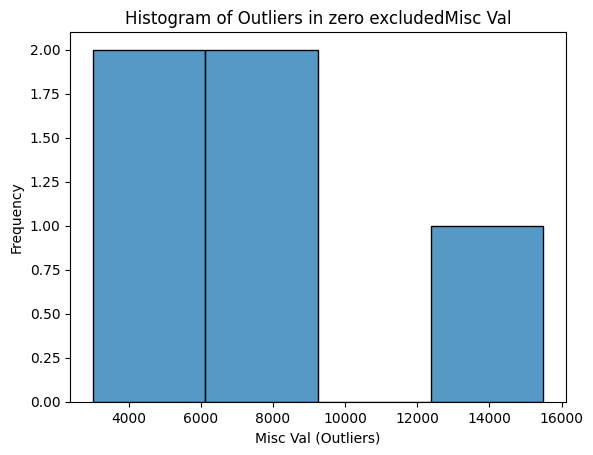

In [237]:
detect_outliers_iqr_exclude_zeros(df,continous_feat)

In [238]:
#df_no_outliers = outliers_handler_exclude_zeros(df, continous_feat)

In [304]:
df_no_outliers.isna().sum()

MS SubClass        0
MS Zoning          0
Lot Frontage       0
Lot Area           0
Street             0
Alley              0
Lot Shape          0
Land Contour       0
Utilities          0
Lot Config         0
Land Slope         0
Neighborhood       0
Condition 1        0
Condition 2        0
Bldg Type          0
House Style        0
Overall Qual       0
Overall Cond       0
Year Built         0
Year Remod/Add     0
Roof Style         0
Roof Matl          0
Exterior 1st       0
Exterior 2nd       0
Mas Vnr Type       0
Mas Vnr Area       0
Exter Qual         0
Exter Cond         0
Foundation         0
Bsmt Qual          0
Bsmt Cond          0
Bsmt Exposure      0
BsmtFin Type 1     0
BsmtFin SF 1       0
BsmtFin Type 2     0
BsmtFin SF 2       0
Bsmt Unf SF        0
Total Bsmt SF      0
Heating            0
Heating QC         0
Central Air        0
Electrical         0
1st Flr SF         0
2nd Flr SF         0
Low Qual Fin SF    0
Gr Liv Area        0
Bsmt Full Bath     0
Bsmt Half Bat

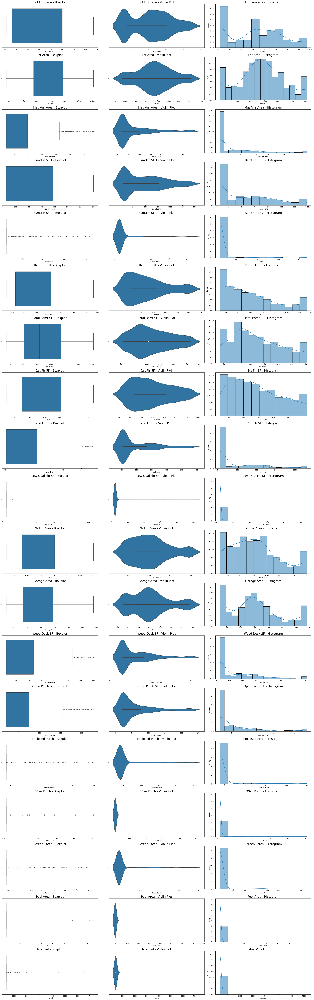

In [239]:
detect_box_voilin_hist(df, continous_feat)

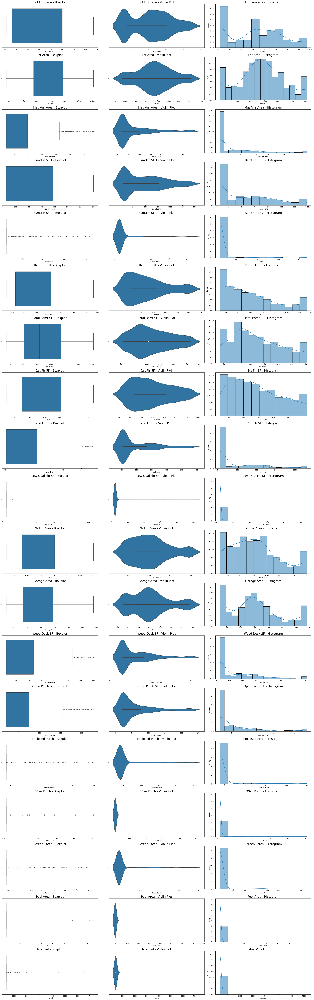

In [240]:
detect_box_voilin_hist_exclude_zeros(df,continous_feat)


 
 ------------------- Lot Frontage ------------------- 

Outliers of  Lot Frontage  from IQR method:  length:  0  -  set()
before lower bound of  Lot Frontage  :  length:  0  -  set()
after upper bound of  Lot Frontage  :  length:  0  -  set()


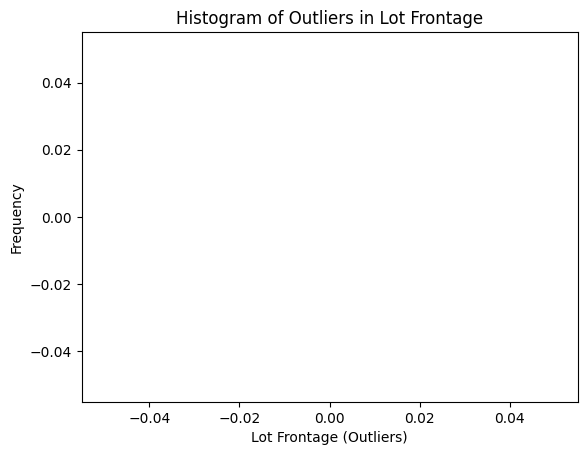


 
 ------------------- Lot Area ------------------- 

Outliers of  Lot Area  from IQR method:  length:  0  -  set()
before lower bound of  Lot Area  :  length:  0  -  set()
after upper bound of  Lot Area  :  length:  0  -  set()


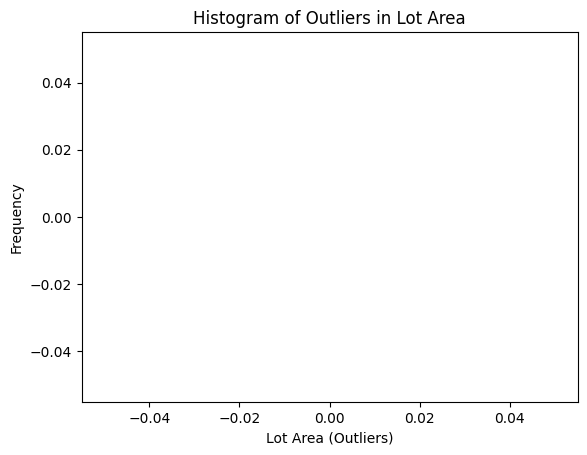


 
 ------------------- Mas Vnr Area ------------------- 

Outliers of  Mas Vnr Area  from IQR method:  length:  68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.0, 549.0, 426.0, 554.0, 428.0, 436.0, 564.0, 567.0, 568.0, 448.0, 452.0, 456.0, 466.0, 594.0, 468.0, 472.0, 473.0, 600.0, 604.0, 480.0, 616.0, 491.0, 492.0, 621.0, 632.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  Mas Vnr Area  :  length:  0  -  set()
after upper bound of  Mas Vnr Area  :  length:  68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.0, 549.0, 426.0, 554.0, 428.0, 436.0, 564.0, 567.0, 568.0, 448.0, 452.0, 456.0, 466.0, 594.0, 468.0, 472.0, 473.0, 600.0, 604.0, 480.0, 616.0, 491.0, 492.0, 621.0, 632.0, 495.0, 502.0, 504.0, 510.0}


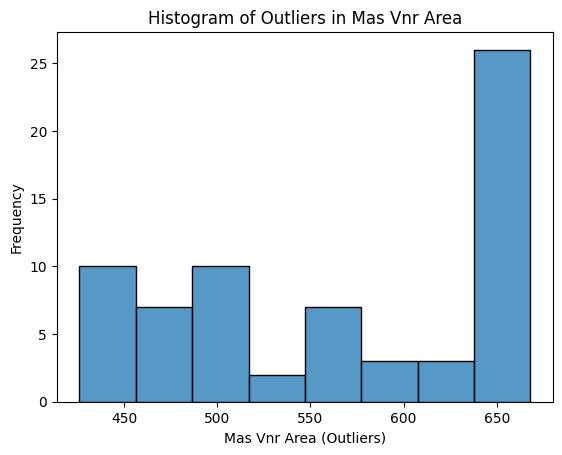


 
 ------------------- BsmtFin SF 1 ------------------- 

Outliers of  BsmtFin SF 1  from IQR method:  length:  68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.0, 549.0, 426.0, 554.0, 428.0, 436.0, 564.0, 567.0, 568.0, 448.0, 452.0, 456.0, 466.0, 594.0, 468.0, 472.0, 473.0, 600.0, 604.0, 480.0, 616.0, 491.0, 492.0, 621.0, 632.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  BsmtFin SF 1  :  length:  0  -  set()
after upper bound of  BsmtFin SF 1  :  length:  68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.0, 549.0, 426.0, 554.0, 428.0, 436.0, 564.0, 567.0, 568.0, 448.0, 452.0, 456.0, 466.0, 594.0, 468.0, 472.0, 473.0, 600.0, 604.0, 480.0, 616.0, 491.0, 492.0, 621.0, 632.0, 495.0, 502.0, 504.0, 510.0}


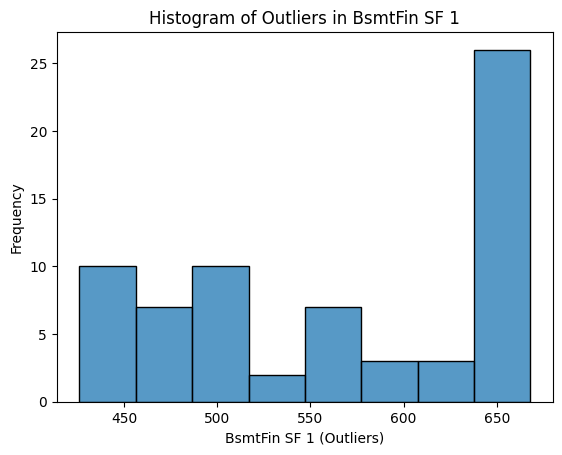


 
 ------------------- BsmtFin SF 2 ------------------- 

Outliers of  BsmtFin SF 2  from IQR method:  length:  165  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 186.0, 193.0, 196.0, 206.0, 208.0, 211.0, 723.0, 219.0, 228.0, 240.0, 247.0, 264.0, 273.0, 279.0, 287.0, 799.0, 290.0, 294.0, 811.0, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0, 456.0, 466.0, 468.0, 472.0, 473.0, 480.0, 488.0, 491.0, 492.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  BsmtFin SF 2  :  length:  0  -  set()
after upper 

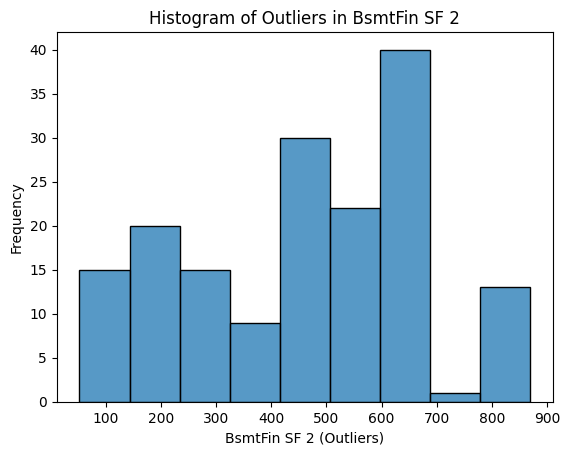


 
 ------------------- Bsmt Unf SF ------------------- 

Outliers of  Bsmt Unf SF  from IQR method:  length:  165  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 186.0, 193.0, 196.0, 206.0, 208.0, 211.0, 723.0, 219.0, 228.0, 240.0, 247.0, 264.0, 273.0, 279.0, 287.0, 799.0, 290.0, 294.0, 811.0, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0, 456.0, 466.0, 468.0, 472.0, 473.0, 480.0, 488.0, 491.0, 492.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  Bsmt Unf SF  :  length:  0  -  set()
after upper bou

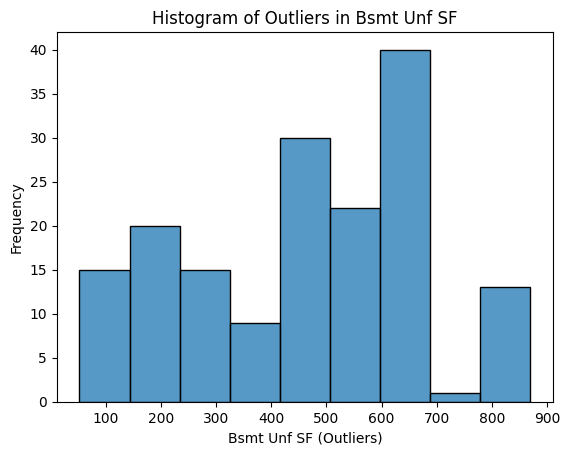


 
 ------------------- Total Bsmt SF ------------------- 

Outliers of  Total Bsmt SF  from IQR method:  length:  165  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 186.0, 193.0, 196.0, 206.0, 208.0, 211.0, 723.0, 219.0, 228.0, 240.0, 247.0, 264.0, 273.0, 279.0, 287.0, 799.0, 290.0, 294.0, 811.0, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0, 456.0, 466.0, 468.0, 472.0, 473.0, 480.0, 488.0, 491.0, 492.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  Total Bsmt SF  :  length:  0  -  set()
after upp

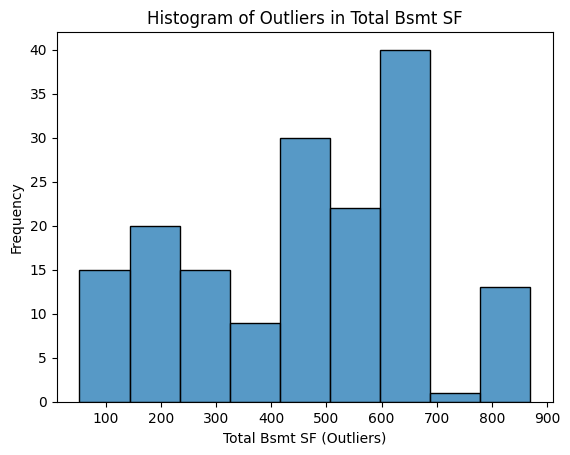


 
 ------------------- 1st Flr SF ------------------- 

Outliers of  1st Flr SF  from IQR method:  length:  165  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 186.0, 193.0, 196.0, 206.0, 208.0, 211.0, 723.0, 219.0, 228.0, 240.0, 247.0, 264.0, 273.0, 279.0, 287.0, 799.0, 290.0, 294.0, 811.0, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0, 456.0, 466.0, 468.0, 472.0, 473.0, 480.0, 488.0, 491.0, 492.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of  1st Flr SF  :  length:  0  -  set()
after upper bound 

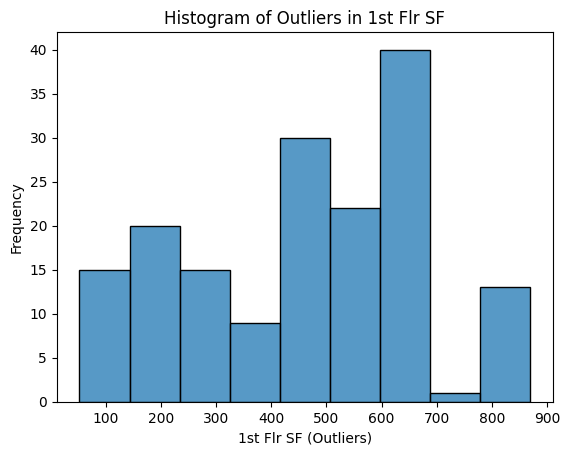


 
 ------------------- 2nd Flr SF ------------------- 

Outliers of  2nd Flr SF  from IQR method:  length:  201  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 186.0, 1215.0, 193.0, 196.0, 206.0, 208.0, 1232.0, 211.0, 723.0, 1237.0, 1238.0, 219.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0, 456.0, 466.0, 468.0, 472.0, 473.0, 480.0, 488.0,

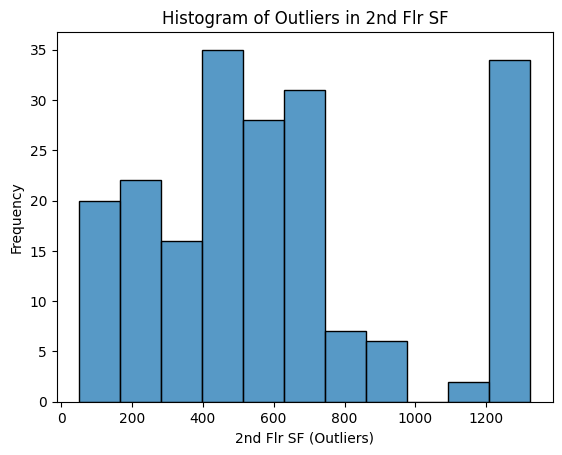


 
 ------------------- Low Qual Fin SF ------------------- 

Outliers of  Low Qual Fin SF  from IQR method:  length:  207  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 629.7999999999998, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 156.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 186.0, 1215.0, 193.0, 196.0, 205.0, 206.0, 208.0, 1232.0, 211.0, 723.0, 1237.0, 1238.0, 219.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 384.0, 391.0, 400.0, 420.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0

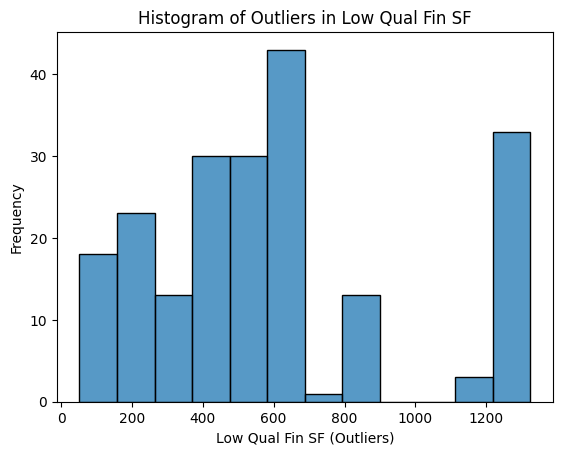


 
 ------------------- Gr Liv Area ------------------- 

Outliers of  Gr Liv Area  from IQR method:  length:  207  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 629.7999999999998, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 156.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 186.0, 1215.0, 193.0, 196.0, 205.0, 206.0, 208.0, 1232.0, 211.0, 723.0, 1237.0, 1238.0, 219.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 384.0, 391.0, 400.0, 420.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0,

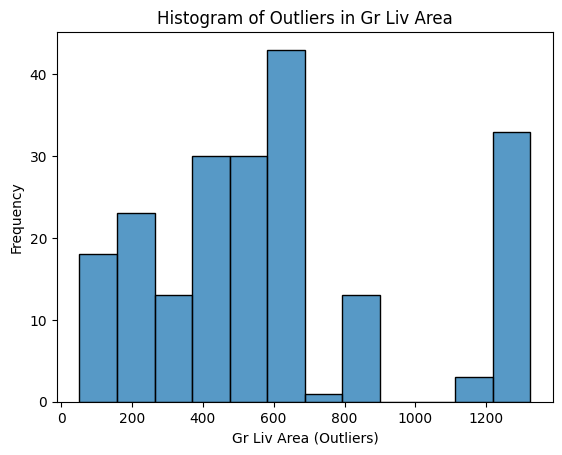


 
 ------------------- Garage Area ------------------- 

Outliers of  Garage Area  from IQR method:  length:  207  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 629.7999999999998, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 156.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 186.0, 1215.0, 193.0, 196.0, 205.0, 206.0, 208.0, 1232.0, 211.0, 723.0, 1237.0, 1238.0, 219.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 384.0, 391.0, 400.0, 420.0, 426.0, 428.0, 435.0, 436.0, 438.0, 448.0, 449.0, 452.0,

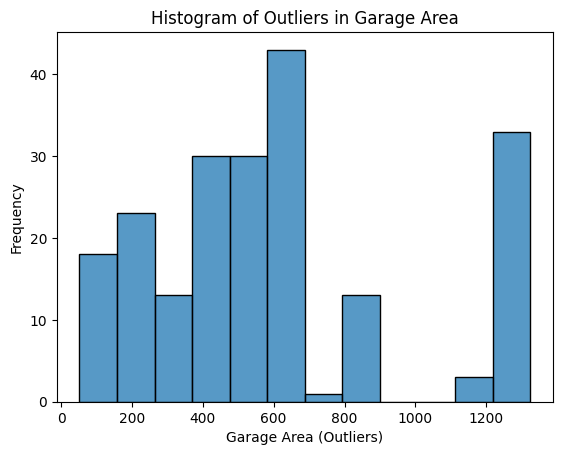


 
 ------------------- Wood Deck SF ------------------- 

Outliers of  Wood Deck SF  from IQR method:  length:  244  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 629.7999999999998, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 156.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 186.0, 1215.0, 193.0, 196.0, 205.0, 206.0, 208.0, 1232.0, 211.0, 723.0, 1237.0, 1238.0, 219.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 308.0, 823.0, 829.0, 319.0, 328.0, 841.0, 842.0, 333.0, 336.0, 339.0, 852.0, 340.0, 342.0, 351.0, 355.0, 869.9999999999998, 358.0, 362.0, 364.0, 374.0, 380.0, 382.0, 384.0, 385.0, 390.

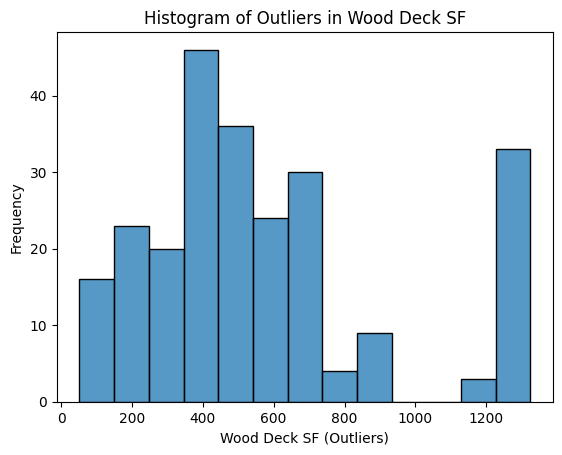


 
 ------------------- Open Porch SF ------------------- 

Outliers of  Open Porch SF  from IQR method:  length:  316  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 554.0, 555.0, 564.0, 52.0, 567.0, 568.0, 60.0, 64.0, 580.0, 80.0, 594.0, 596.0, 600.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 616.0, 106.0, 619.0, 108.0, 621.0, 110.0, 629.7999999999998, 120.0, 632.0, 121.0, 125.0, 128.0, 645.0, 647.0, 651.0, 139.0, 147.0, 660.0, 664.0, 153.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 172.0, 174.0, 175.0, 176.0, 180.0, 181.0, 182.0, 1208.0, 184.0, 186.0, 187.0, 189.0, 1215.0, 191.0, 193.0, 192.0, 194.0, 196.0, 195.0, 200.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 1232.0, 210.0, 211.0, 723.0, 1237.0, 1238.0, 213.0, 214.0, 216.0, 217.0, 219.0, 224.0, 1250.0, 228.0, 1254.0, 1259.0, 240.0, 247.0, 1277.0, 1285.0, 264.0, 1288.0, 273.0, 279.0, 1306.0, 1309.0, 287.0, 799.0, 290.0, 294.0, 1319.0, 811.0, 1324.5, 306.0, 

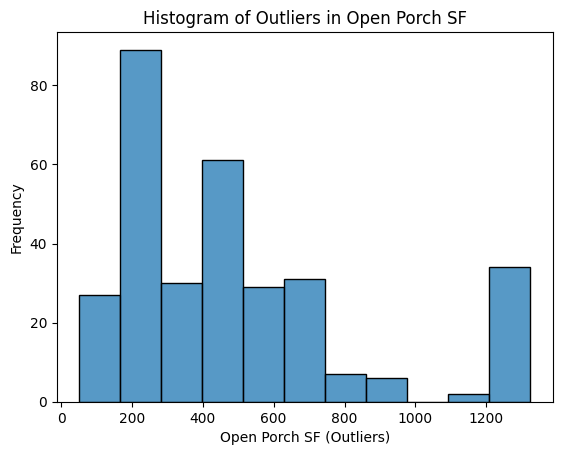


 
 ------------------- Enclosed Porch ------------------- 

Outliers of  Enclosed Porch  from IQR method:  length:  423  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 40.0, 41.0, 554.0, 555.0, 48.0, 564.0, 52.0, 567.0, 568.0, 55.0, 60.0, 64.0, 66.0, 580.0, 68.0, 70.0, 80.0, 594.0, 596.0, 84.0, 87.0, 600.0, 90.0, 604.0, 93.0, 606.0, 92.0, 608.0, 96.0, 99.0, 612.0, 613.0, 100.0, 101.0, 616.0, 102.0, 106.0, 619.0, 108.0, 621.0, 110.0, 109.0, 112.0, 116.0, 629.7999999999998, 117.0, 120.0, 632.0, 121.0, 122.0, 123.0, 125.0, 126.0, 128.0, 645.0, 134.0, 647.0, 137.0, 138.0, 651.0, 139.0, 140.0, 144.0, 145.0, 147.0, 660.0, 148.0, 150.0, 664.0, 153.0, 154.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 172.0, 174.0, 175.0, 176.0, 180.0, 181.0, 182.0, 183.0, 1208.0, 184.0, 186.0, 187.0, 185.0, 189.0, 190.0, 1215.0, 191.0, 193.0, 192.0, 194.0, 196.0, 195.0, 200.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 1232.0, 210.0, 21

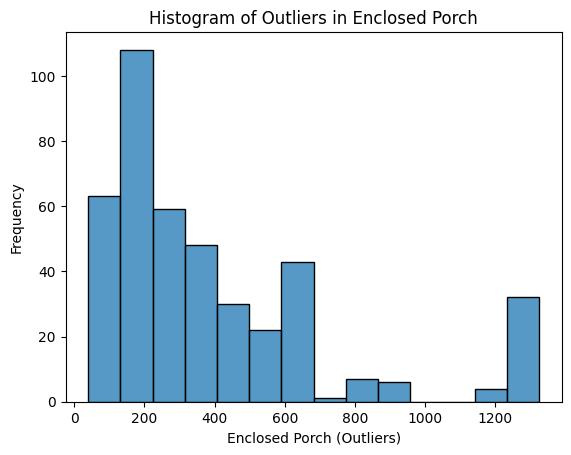


 
 ------------------- 3Ssn Porch ------------------- 

Outliers of  3Ssn Porch  from IQR method:  length:  433  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 40.0, 41.0, 554.0, 555.0, 48.0, 564.0, 52.0, 567.0, 568.0, 55.0, 60.0, 64.0, 66.0, 580.0, 68.0, 70.0, 80.0, 594.0, 596.0, 84.0, 87.0, 600.0, 90.0, 604.0, 93.0, 606.0, 92.0, 608.0, 96.0, 99.0, 612.0, 613.0, 100.0, 101.0, 616.0, 102.0, 106.0, 619.0, 108.0, 621.0, 110.0, 109.0, 112.0, 116.0, 629.7999999999998, 117.0, 120.0, 632.0, 121.0, 122.0, 123.0, 125.0, 126.0, 128.0, 645.0, 134.0, 647.0, 137.0, 138.0, 651.0, 139.0, 140.0, 144.0, 145.0, 147.0, 660.0, 148.0, 150.0, 664.0, 153.0, 154.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 172.0, 174.0, 175.0, 176.0, 180.0, 181.0, 182.0, 183.0, 1208.0, 184.0, 186.0, 187.0, 185.0, 189.0, 190.0, 1215.0, 191.0, 193.0, 192.0, 194.0, 196.0, 195.0, 200.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 1232.0, 210.0, 211.0, 723

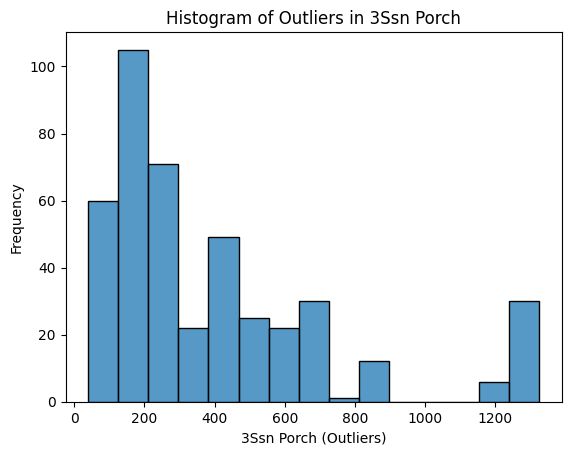


 
 ------------------- Screen Porch ------------------- 

Outliers of  Screen Porch  from IQR method:  length:  503  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 40.0, 41.0, 554.0, 555.0, 48.0, 564.0, 52.0, 567.0, 568.0, 55.0, 60.0, 64.0, 66.0, 580.0, 68.0, 70.0, 80.0, 594.0, 596.0, 84.0, 87.0, 600.0, 90.0, 604.0, 93.0, 606.0, 92.0, 608.0, 96.0, 95.0, 99.0, 612.0, 613.0, 100.0, 101.0, 616.0, 102.0, 106.0, 619.0, 108.0, 621.0, 110.0, 109.0, 112.0, 116.0, 629.7999999999998, 117.0, 120.0, 632.0, 121.0, 122.0, 123.0, 125.0, 126.0, 128.0, 130.0, 645.0, 134.0, 647.0, 135.0, 137.0, 138.0, 651.0, 139.0, 140.0, 141.0, 142.0, 144.0, 145.0, 147.0, 660.0, 148.0, 150.0, 664.0, 153.0, 154.0, 155.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 161.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 163.0, 172.0, 171.0, 174.0, 175.0, 176.0, 178.0, 180.0, 181.0, 182.0, 183.0, 1208.0, 184.0, 186.0, 187.0, 185.0, 189.0, 190.0, 1215.0, 191.0, 193.0, 192.0, 194.0, 196.0, 195.0, 1

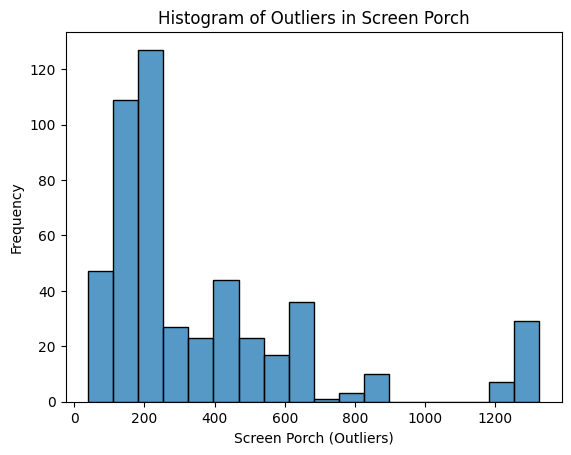


 
 ------------------- Pool Area ------------------- 

Outliers of  Pool Area  from IQR method:  length:  506  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 40.0, 41.0, 554.0, 555.0, 48.0, 564.0, 52.0, 567.0, 568.0, 55.0, 60.0, 572.85, 64.0, 66.0, 580.0, 68.0, 70.0, 80.0, 594.0, 596.0, 84.0, 87.0, 600.0, 90.0, 604.0, 93.0, 606.0, 92.0, 608.0, 96.0, 95.0, 99.0, 612.0, 613.0, 100.0, 101.0, 616.0, 102.0, 106.0, 619.0, 108.0, 621.0, 110.0, 109.0, 112.0, 116.0, 629.7999999999998, 117.0, 120.0, 632.0, 121.0, 122.0, 123.0, 125.0, 126.0, 128.0, 130.0, 645.0, 134.0, 647.0, 135.0, 137.0, 138.0, 651.0, 139.0, 140.0, 141.0, 142.0, 144.0, 145.0, 147.0, 660.0, 148.0, 150.0, 664.0, 153.0, 154.0, 155.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 161.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 163.0, 172.0, 171.0, 174.0, 175.0, 176.0, 178.0, 180.0, 181.0, 182.0, 183.0, 1208.0, 184.0, 186.0, 187.0, 185.0, 189.0, 190.0, 1215.0, 191.0, 193.0, 192.0, 194.0, 196.0, 195.0,

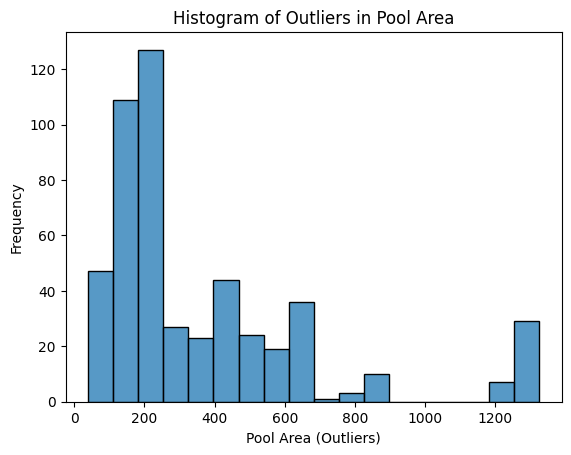


 
 ------------------- Misc Val ------------------- 

Outliers of  Misc Val  from IQR method:  length:  532  -  {513.0, 515.0, 525.0, 526.0, 531.0, 532.0, 539.0, 543.0, 549.0, 40.0, 41.0, 554.0, 555.0, 48.0, 560.0, 7219.999999999997, 564.0, 52.0, 567.0, 568.0, 55.0, 60.0, 572.85, 64.0, 66.0, 580.0, 68.0, 70.0, 80.0, 594.0, 596.0, 84.0, 87.0, 600.0, 90.0, 604.0, 93.0, 606.0, 92.0, 608.0, 96.0, 95.0, 99.0, 612.0, 613.0, 100.0, 101.0, 616.0, 102.0, 106.0, 619.0, 108.0, 621.0, 110.0, 109.0, 112.0, 116.0, 629.7999999999998, 117.0, 120.0, 632.0, 121.0, 122.0, 123.0, 125.0, 126.0, 1150.0, 128.0, 130.0, 645.0, 134.0, 647.0, 135.0, 137.0, 138.0, 651.0, 139.0, 140.0, 141.0, 142.0, 144.0, 145.0, 650.0, 147.0, 660.0, 148.0, 150.0, 664.0, 153.0, 154.0, 155.0, 668.0, 156.0, 670.0, 158.0, 159.0, 160.0, 162.0, 161.0, 164.0, 165.0, 166.0, 167.0, 679.0, 169.0, 168.0, 163.0, 172.0, 171.0, 174.0, 175.0, 176.0, 1200.0, 178.0, 180.0, 181.0, 182.0, 183.0, 1208.0, 184.0, 186.0, 187.0, 185.0, 189.0, 190.0, 12

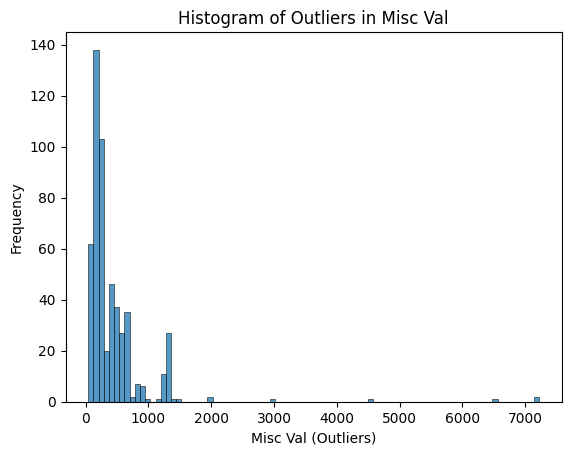

In [241]:
detect_outliers_iqr(df,continous_feat)


 
 ------------------- Lot Frontage ------------------- 

Outliers of Lot Frontage from IQR method:  length: 0  -  set()
before lower bound of Lot Frontage : length: 0  -  set()
after upper bound of Lot Frontage : length: 0  -  set()

 
 ------------------- Lot Area ------------------- 

Outliers of Lot Area from IQR method:  length: 0  -  set()
before lower bound of Lot Area : length: 0  -  set()
after upper bound of Lot Area : length: 0  -  set()

 
 ------------------- Mas Vnr Area ------------------- 

Outliers of Mas Vnr Area from IQR method:  length: 68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.0, 549.0, 426.0, 554.0, 428.0, 436.0, 564.0, 567.0, 568.0, 448.0, 452.0, 456.0, 466.0, 594.0, 468.0, 472.0, 473.0, 600.0, 604.0, 480.0, 616.0, 491.0, 492.0, 621.0, 632.0, 495.0, 502.0, 504.0, 510.0}
before lower bound of Mas Vnr Area : length: 0  -  set()
after upper bound of Mas Vnr Area : length: 68  -  {513.0, 515.0, 647.0, 651.0, 525.0, 526.0, 660.0, 664.0, 668.

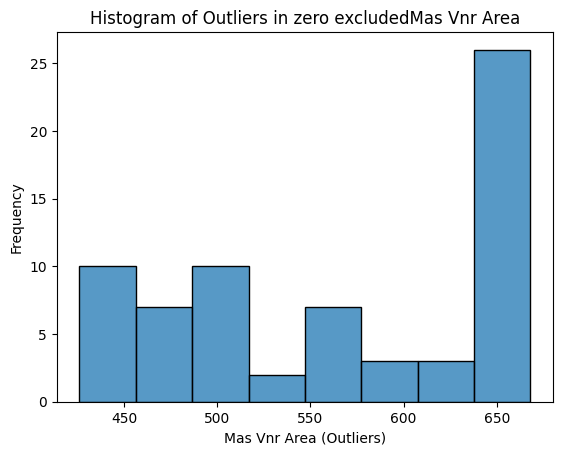


 
 ------------------- BsmtFin SF 1 ------------------- 

Outliers of BsmtFin SF 1 from IQR method:  length: 0  -  set()
before lower bound of BsmtFin SF 1 : length: 0  -  set()
after upper bound of BsmtFin SF 1 : length: 0  -  set()

 
 ------------------- BsmtFin SF 2 ------------------- 

Outliers of BsmtFin SF 2 from IQR method:  length: 97  -  {531.0, 532.0, 539.0, 543.0, 555.0, 52.0, 60.0, 64.0, 580.0, 80.0, 596.0, 604.0, 93.0, 606.0, 608.0, 612.0, 613.0, 106.0, 619.0, 108.0, 110.0, 120.0, 121.0, 125.0, 128.0, 645.0, 139.0, 147.0, 153.0, 670.0, 162.0, 167.0, 679.0, 169.0, 175.0, 176.0, 180.0, 181.0, 182.0, 186.0, 193.0, 196.0, 206.0, 208.0, 211.0, 723.0, 219.0, 228.0, 240.0, 247.0, 264.0, 273.0, 279.0, 287.0, 799.0, 290.0, 294.0, 811.0, 306.0, 308.0, 823.0, 829.0, 319.0, 841.0, 842.0, 336.0, 852.0, 351.0, 869.9999999999998, 374.0, 380.0, 382.0, 391.0, 400.0, 435.0, 438.0, 449.0, 456.0, 488.0, 491.0, 492.0, 495.0}
before lower bound of BsmtFin SF 2 : length: 0  -  set()
after upp

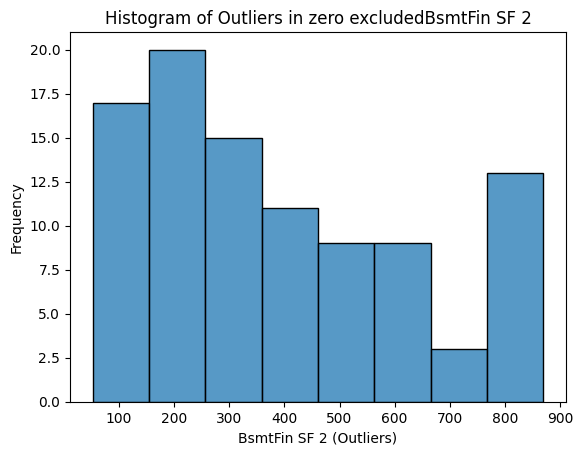


 
 ------------------- Bsmt Unf SF ------------------- 

Outliers of Bsmt Unf SF from IQR method:  length: 0  -  set()
before lower bound of Bsmt Unf SF : length: 0  -  set()
after upper bound of Bsmt Unf SF : length: 0  -  set()

 
 ------------------- Total Bsmt SF ------------------- 

Outliers of Total Bsmt SF from IQR method:  length: 0  -  set()
before lower bound of Total Bsmt SF : length: 0  -  set()
after upper bound of Total Bsmt SF : length: 0  -  set()

 
 ------------------- 1st Flr SF ------------------- 

Outliers of 1st Flr SF from IQR method:  length: 0  -  set()
before lower bound of 1st Flr SF : length: 0  -  set()
after upper bound of 1st Flr SF : length: 0  -  set()

 
 ------------------- 2nd Flr SF ------------------- 

Outliers of 2nd Flr SF from IQR method:  length: 36  -  {1250.0, 1309.0, 1285.0, 1254.0, 1319.0, 1288.0, 1259.0, 1324.5, 1232.0, 1237.0, 1238.0, 1208.0, 1306.0, 1277.0, 1215.0}
before lower bound of 2nd Flr SF : length: 0  -  set()
after upper bo

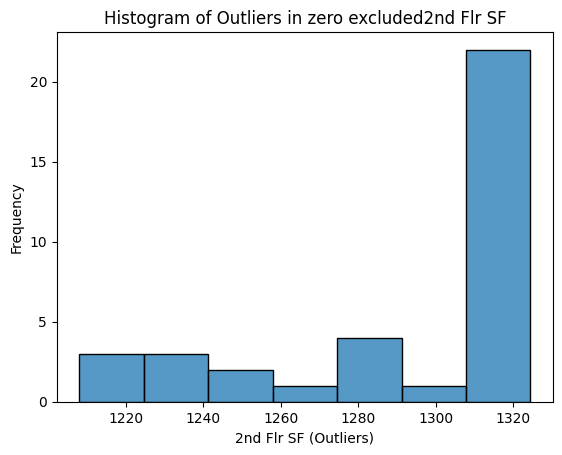


 
 ------------------- Low Qual Fin SF ------------------- 

Outliers of Low Qual Fin SF from IQR method:  length: 6  -  {384.0, 420.0, 205.0, 629.7999999999998, 473.0, 156.0}
before lower bound of Low Qual Fin SF : length: 0  -  set()
after upper bound of Low Qual Fin SF : length: 6  -  {384.0, 420.0, 205.0, 629.7999999999998, 473.0, 156.0}


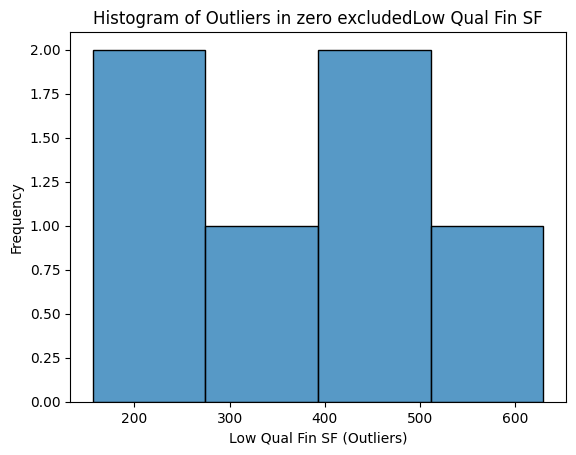


 
 ------------------- Gr Liv Area ------------------- 

Outliers of Gr Liv Area from IQR method:  length: 0  -  set()
before lower bound of Gr Liv Area : length: 0  -  set()
after upper bound of Gr Liv Area : length: 0  -  set()

 
 ------------------- Garage Area ------------------- 

Outliers of Garage Area from IQR method:  length: 0  -  set()
before lower bound of Garage Area : length: 0  -  set()
after upper bound of Garage Area : length: 0  -  set()

 
 ------------------- Wood Deck SF ------------------- 

Outliers of Wood Deck SF from IQR method:  length: 37  -  {385.0, 355.0, 358.0, 390.0, 328.0, 362.0, 364.0, 333.0, 400.0, 400.69999999999993, 339.0, 340.0, 342.0, 382.0}
before lower bound of Wood Deck SF : length: 0  -  set()
after upper bound of Wood Deck SF : length: 37  -  {385.0, 355.0, 358.0, 390.0, 328.0, 362.0, 364.0, 333.0, 400.0, 400.69999999999993, 339.0, 340.0, 342.0, 382.0}


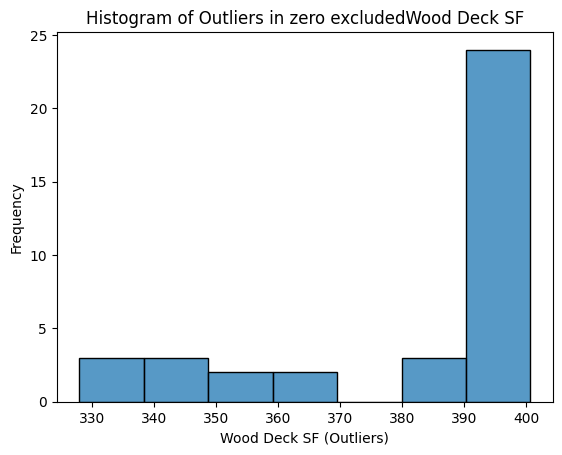


 
 ------------------- Open Porch SF ------------------- 

Outliers of Open Porch SF from IQR method:  length: 72  -  {158.0, 159.0, 160.0, 164.0, 165.0, 166.0, 168.0, 172.0, 174.0, 175.0, 180.0, 182.0, 184.0, 187.0, 189.0, 191.0, 192.0, 194.0, 195.0, 200.0, 203.0, 204.0, 205.0, 207.0, 210.0, 211.0, 213.0, 214.0, 216.0, 217.0, 224.0, 228.0}
before lower bound of Open Porch SF : length: 0  -  set()
after upper bound of Open Porch SF : length: 72  -  {158.0, 159.0, 160.0, 164.0, 165.0, 166.0, 168.0, 172.0, 174.0, 175.0, 180.0, 182.0, 184.0, 187.0, 189.0, 191.0, 192.0, 194.0, 195.0, 200.0, 203.0, 204.0, 205.0, 207.0, 210.0, 211.0, 213.0, 214.0, 216.0, 217.0, 224.0, 228.0}


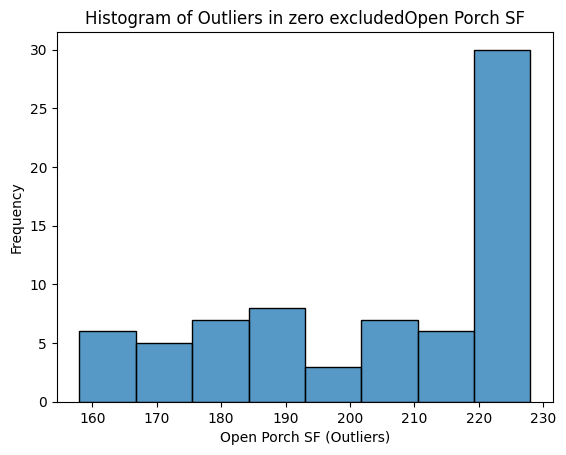


 
 ------------------- Enclosed Porch ------------------- 

Outliers of Enclosed Porch from IQR method:  length: 107  -  {128.0, 134.0, 137.0, 138.0, 139.0, 140.0, 144.0, 145.0, 148.0, 150.0, 154.0, 156.0, 160.0, 164.0, 165.0, 40.0, 41.0, 172.0, 174.0, 48.0, 176.0, 52.0, 180.0, 55.0, 183.0, 185.0, 60.0, 190.0, 192.0, 66.0, 194.0, 68.0, 70.0, 204.0, 205.0, 207.0, 80.0, 210.0, 84.0, 212.0, 214.0, 87.0, 216.0, 90.0, 218.0, 92.0, 219.0, 96.0, 224.0, 248.0, 99.0, 100.0, 101.0, 102.0, 231.0, 249.0, 250.2, 108.0, 109.0, 236.0, 239.0, 112.0, 116.0, 117.0, 246.0, 120.0, 121.0, 122.0, 123.0, 126.0}
before lower bound of Enclosed Porch : length: 0  -  set()
after upper bound of Enclosed Porch : length: 107  -  {128.0, 134.0, 137.0, 138.0, 139.0, 140.0, 144.0, 145.0, 148.0, 150.0, 154.0, 156.0, 160.0, 164.0, 165.0, 40.0, 41.0, 172.0, 174.0, 48.0, 176.0, 52.0, 180.0, 55.0, 183.0, 185.0, 60.0, 190.0, 192.0, 66.0, 194.0, 68.0, 70.0, 204.0, 205.0, 207.0, 80.0, 210.0, 84.0, 212.0, 214.0, 87.0, 216.0, 

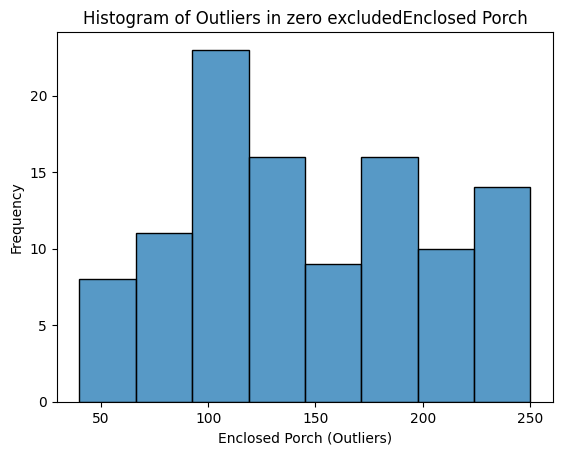


 
 ------------------- 3Ssn Porch ------------------- 

Outliers of 3Ssn Porch from IQR method:  length: 10  -  {355.5, 168.0, 174.0, 304.0, 245.0, 120.0, 153.0, 216.0}
before lower bound of 3Ssn Porch : length: 0  -  set()
after upper bound of 3Ssn Porch : length: 10  -  {355.5, 168.0, 174.0, 304.0, 245.0, 120.0, 153.0, 216.0}


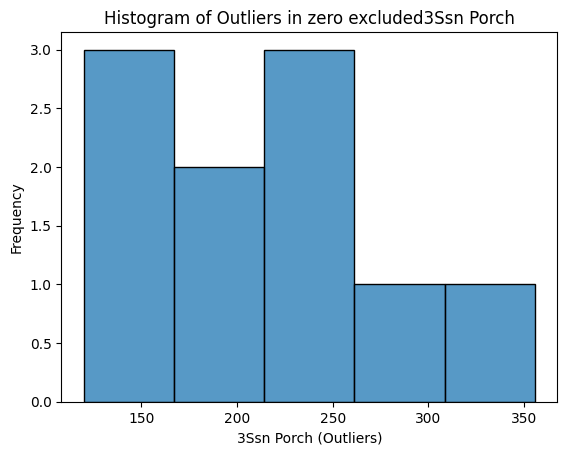


 
 ------------------- Screen Porch ------------------- 

Outliers of Screen Porch from IQR method:  length: 70  -  {256.0, 130.0, 260.0, 135.0, 265.0, 266.0, 141.0, 142.0, 144.0, 273.0, 147.0, 276.0, 155.0, 156.0, 287.0, 287.35, 161.0, 163.0, 164.0, 171.0, 174.0, 175.0, 176.0, 178.0, 180.0, 182.0, 189.0, 192.0, 196.0, 198.0, 200.0, 201.0, 208.0, 216.0, 217.0, 220.0, 221.0, 95.0, 224.0, 227.0, 100.0, 120.0, 255.0}
before lower bound of Screen Porch : length: 0  -  set()
after upper bound of Screen Porch : length: 70  -  {256.0, 130.0, 260.0, 135.0, 265.0, 266.0, 141.0, 142.0, 144.0, 273.0, 147.0, 276.0, 155.0, 156.0, 287.0, 287.35, 161.0, 163.0, 164.0, 171.0, 174.0, 175.0, 176.0, 178.0, 180.0, 182.0, 189.0, 192.0, 196.0, 198.0, 200.0, 201.0, 208.0, 216.0, 217.0, 220.0, 221.0, 95.0, 224.0, 227.0, 100.0, 120.0, 255.0}


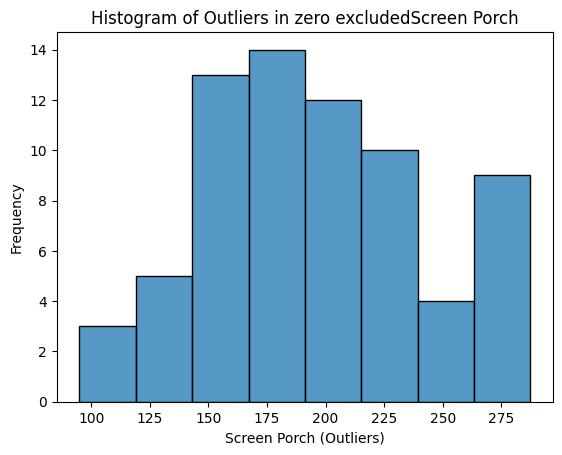


 
 ------------------- Pool Area ------------------- 

Outliers of Pool Area from IQR method:  length: 3  -  {480.0, 555.0, 572.85}
before lower bound of Pool Area : length: 0  -  set()
after upper bound of Pool Area : length: 3  -  {480.0, 555.0, 572.85}


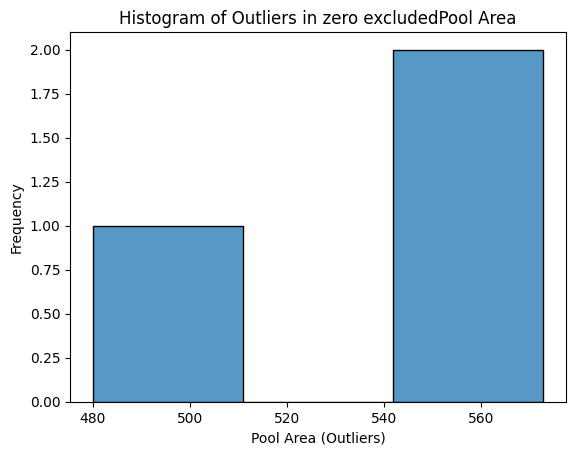


 
 ------------------- Misc Val ------------------- 

Outliers of Misc Val from IQR method:  length: 26  -  {650.0, 1300.0, 4500.0, 560.0, 1200.0, 7219.999999999997, 3000.0, 700.0, 450.0, 2000.0, 600.0, 1500.0, 480.0, 6500.0, 1000.0, 750.0, 500.0, 1400.0, 1150.0}
before lower bound of Misc Val : length: 0  -  set()
after upper bound of Misc Val : length: 26  -  {650.0, 1300.0, 4500.0, 560.0, 1200.0, 7219.999999999997, 3000.0, 700.0, 450.0, 2000.0, 600.0, 1500.0, 480.0, 6500.0, 1000.0, 750.0, 500.0, 1400.0, 1150.0}


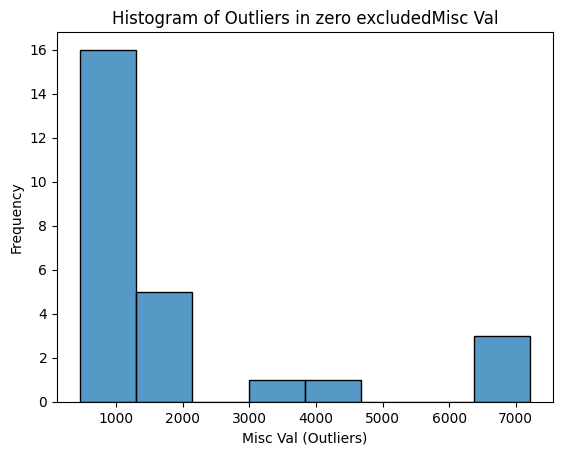

In [242]:
detect_outliers_iqr_exclude_zeros(df,continous_feat)

In [243]:
#df_no_outliers = outliers_handler_exclude_zeros(df, continous_feat)

In [185]:
#df_no_outliers.isna().sum()

In [244]:
#df = df_no_outliers.copy()

encoding

In [245]:
# from sklearn.preprocessing import OneHotEncoder

# #Initialize OneHotEncoder
# encoder = OneHotEncoder(sparse_output=False)

# # Apply one-hot encoding to the categorical columns
# categorical_columns =  ['MS Zoning',  'Alley', 'Land Contour', 'Lot Config', 'Condition 1', 'Condition 2', 'Mas Vnr Type', 'Foundation', 'Heating', 'Garage Type', 'Misc Feature']
# one_hot_encoded = encoder.fit_transform(df[categorical_columns])

# #Create a DataFrame with the one-hot encoded columns
# #We use get_feature_names_out() to get the column names for the encoded data
# one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_columns))

# # Concatenate the one-hot encoded dataframe with the original dataframe
# df_encoded = pd.concat([df_no_outliers, one_hot_df], axis=1)

# # Drop the original categorical columns
# df_encoded = df_encoded.drop(categorical_columns, axis=1)

In [246]:
#df = df_encoded.copy()

In [ ]:
['Lot Shape', 'Utilities', 'Land Slope', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating QC', 'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Neighborhood', 'Street', 'Bldg Type', 'House Style', 'Roof Style', 'Exterior 1st', 'Exterior 2nd', 'Roof Matl', 'Central Air', 'Sale Type', 'Sale Condition', 'Kitchen Qual', '']

In [20]:
ordinal_feat = ['Lot Shape', 'Utilities', 'Land Slope', 'Overall Qual', 'Overall Cond', 'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFinType 2', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence']


In [186]:
order = ['Reg','IR1','IR2','IR3',]
label_encoding(df,'Lot Shape', order)

In [187]:
order = ['AllPub','NoSewr','NoSeWa','ELO']
label_encoding(df,'Utilities', order)

In [188]:
order = ['Gtl','Mod','Sev']
label_encoding(df,'Land Slope', order)

In [189]:
order = ['Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Exter Cond', order)

In [190]:
order = ['No Basement','Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Bsmt Qual', order)

In [191]:
order = ['No Basement','Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Bsmt Cond', order)

In [192]:
order = ['No Basement','No','Mn', 'Av', 'Gd']
label_encoding(df,'Bsmt Exposure', order)

In [193]:
order = ['No Basement','Unf','LwQ','Rec', 'BLQ','ALQ','GLQ' ]
label_encoding(df,'BsmtFin Type 1', order)

In [194]:
order = ['No Basement','Unf','LwQ','Rec', 'BLQ','ALQ','GLQ' ]
label_encoding(df,'BsmtFin Type 2', order)

In [195]:
order = ['Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Heating QC', order)

In [196]:
order = ['No Fireplace','Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Fireplace Qu', order)

In [197]:
order = ['No Garage','Unf','RFn', 'Fin']
label_encoding(df,'Garage Finish', order)

In [198]:
order = ['No Garage','Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Garage Qual', order)

In [199]:
order = ['No Garage','Po','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Garage Cond', order)

In [200]:
order = ['N','P','Y']
label_encoding(df,'Paved Drive', order)

In [201]:
order = ['No Pool','Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Pool QC', order)

In [202]:
order = ['No Fence','MnWw','GdWo', 'MnPrv','GdPrv' ]
label_encoding(df,'Fence', order)

In [203]:
order = df['Neighborhood'].unique()
label_encoding(df,'Neighborhood', order)

In [204]:
order = ['Grvl','Pave' ]
label_encoding(df,'Street', order)

In [205]:
df['Bldg Type'].unique()

array(['1Fam', 'TwnhsE', 'Duplex', 'Twnhs', '2fmCon'], dtype=object)

In [206]:

order = ['1Fam','2fmCon' ,'Duplex' ,'Twnhs' ,'TwnhsE' ]
label_encoding(df,'Bldg Type', order)

In [207]:
order = ['SFoyer','SLvl','1Story', '1.5Unf','1.5Fin' ,'2Story', '2.5Unf', '2.5Fin' ]
label_encoding(df,'House Style', order)

In [208]:
order = ['Flat', 'Shed','Gambrel','Gable', 'Hip','Mansard']
label_encoding(df,'Roof Style', order)

In [209]:
order = df['Exterior 1st'].unique()
label_encoding(df,'Exterior 1st', order)

In [210]:
order = df['Exterior 2nd'].unique()
label_encoding(df,'Exterior 2nd', order)

In [211]:
order = df['Roof Matl'].unique()
label_encoding(df,'Roof Matl', order)

In [212]:
order = ['N','Y']
label_encoding(df,'Central Air', order)

In [213]:
order = df['Sale Type'].unique()
label_encoding(df,'Sale Type', order)

In [214]:

order = df['Sale Condition'].unique()
label_encoding(df,'Sale Condition', order)

In [215]:
df['Kitchen Qual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [216]:
order = ['Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Kitchen Qual', order)

In [217]:
df['Functional'].unique()

array(['Min1', 'Typ', 'Min2', 'Maj2', 'Maj1', 'Mod', 'Sal'], dtype=object)

In [218]:
order = ['Sal','Maj2', 'Maj1','Mod', 'Min2', 'Min1' , 'Typ' ]
label_encoding(df,'Functional', order)

In [219]:
df['Exter Qual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [220]:

order = ['Fa','TA', 'Gd','Ex' ]
label_encoding(df,'Exter Qual', order)

In [221]:


order = ['Mix','FuseP', 'FuseF','FuseA','SBrkr' ]
label_encoding(df,'Electrical', order)

In [222]:

categorical_columns =  ['MS Zoning',  'Alley', 'Land Contour', 'Lot Config', 'Condition 1', 'Condition 2', 'Mas Vnr Type', 'Foundation', 'Heating', 'Garage Type', 'Misc Feature']

for col in categorical_columns:
  order = df[col].unique()
  label_encoding(df,col, order)

In [58]:
df.head()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,120,0,45.0,6264,1,0,1,0,0,0,0,0,0,0,0,2,8,5,1997,1997,3,0,0,0,0,0.0,2,2,0,5,3,2,6,656.0,1,0.0,1008.0,1664.0,0,4,1,4,1682,0,0,1682,1.0,0.0,1,1,1,1,2,6,5,1,3,0,1997.0,3,2,528,3,3,2,0,0,0,0,0,0,0,0,0,0,7,2008,0,0,247900
1,120,0,41.0,5395,1,0,1,1,0,1,0,0,0,0,4,2,8,5,1993,1993,3,0,1,1,0,0.0,2,2,0,4,3,1,6,733.0,1,0.0,604.0,1337.0,0,3,1,4,1337,0,0,1337,1.0,0.0,2,0,2,1,2,5,6,1,3,0,1993.0,2,2,462,3,3,2,96,0,70,168,0,0,0,0,0,0,10,2008,0,0,180000
2,120,0,39.0,5070,1,0,1,1,0,1,0,0,0,0,4,2,8,5,1992,1992,3,0,1,1,0,0.0,2,2,0,4,3,2,1,0.0,1,0.0,1280.0,1280.0,0,4,1,4,1280,0,0,1280,0.0,0.0,2,0,2,1,2,5,6,0,0,0,1992.0,2,2,506,3,3,2,0,82,0,0,144,0,0,0,0,0,8,2008,0,0,180000
3,60,0,100.0,10839,1,0,1,0,0,0,0,1,0,0,0,5,6,5,1997,1998,3,0,2,2,0,0.0,1,2,0,4,3,1,1,0.0,1,0.0,926.0,926.0,0,4,1,4,926,678,0,1604,0.0,0.0,2,1,3,1,1,7,6,1,3,0,1997.0,3,2,470,3,3,2,0,36,0,0,0,0,0,0,0,0,7,2008,0,0,181000
4,60,0,73.0,11184,1,0,1,0,0,0,0,1,0,0,0,5,6,5,1998,1998,3,0,2,2,0,0.0,1,2,0,4,3,1,1,0.0,1,0.0,932.0,932.0,0,3,1,4,932,701,0,1633,0.0,0.0,2,1,3,1,1,7,6,1,3,0,1998.0,3,2,460,3,3,2,0,39,0,0,0,0,0,0,0,0,4,2008,0,1,183000


In [292]:
df.describe()

,MS SubClass,Lot Frontage,Lot Area,Street,Lot Shape,Utilities,Land Slope,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Area,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Alley_Grvl,Alley_No alley access,Alley_Pave,Land Contour_Bnk,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Condition 1_Artery,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Artery,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosA,Condition 2_PosN,Condition 2_RRAe,Condition 2_RRAn,Condition 2_RRNn,Mas Vnr Type_BrkCmn,Mas Vnr Type_BrkFace,Mas Vnr Type_Stone,Mas Vnr Type_no mas vnr,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Type_No Garage,Misc Feature_Gar2,Misc Feature_No Misc Feature,Misc Feature_Othr,Misc Feature_Shed
count,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,9.000000e+02,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.0,900.000000,9.000000e+02,900.000000,900.000000,900.0,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000
mean,59.411111,61.992111,9524.112764,0.994444,0.436667,0.001111,0.040000,9.517778,0.603333,3.088889,6.340000,5.583333,1976.127778,1987.368889,3.164444,0.050000,3.134444,3.284444,135.038611,1.484444,2.076667,3.595556,2.953333,1.693333,3.684444,457.723611,1.250000,71.973278,588.491389,1086.677222,3.262222,0.950000,3.913333,1168.732597,577.356667,1.224000e+02,1520.100889,0.428889,0.064444,1.634444,0.410000,2.861111,1.038889,1.603333,6.493333,5.878889,0.604444,1.870000,1884.998889,1.825556,1.856667,501.074556,2.830000,2.840000,1.861111,120.400444,57.266500,48.684111,108.0,100.085278,1.944000e+02,0.015556,0.478889,400.0,6.397778,2007.678889,0.313333,0.481111,192203.6

normalization and standerdization


Features that are highly positively skewed (skewness > 1) are: ['Lot Frontage', 'Lot Area', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', 'Gr Liv Area', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', '3Ssn Porch', 'Screen Porch', 'Misc Val']
Features that are highly negatively skewed (skewness <-1) are: ['Pool Area']
Features that are moderately positively skewed (0.5 < skewness < 1) are: ['BsmtFin SF 2', 'Bsmt Unf SF', '2nd Flr SF', 'Low Qual Fin SF']
Features that are moderately negatively skewed (-0.5 < skewness < -1) are: []
Features that are normally distributed (-0.5 < skewness < 0.5) are: ['Enclosed Porch']



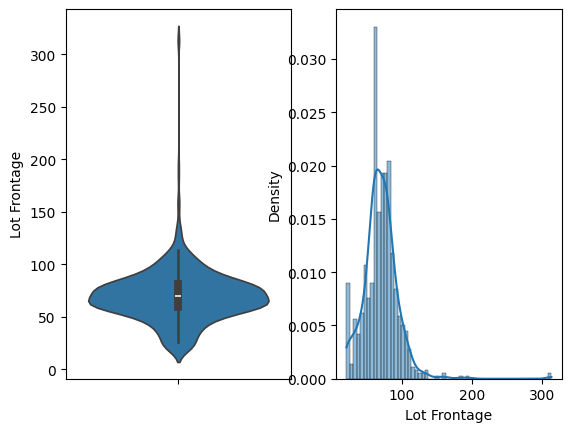

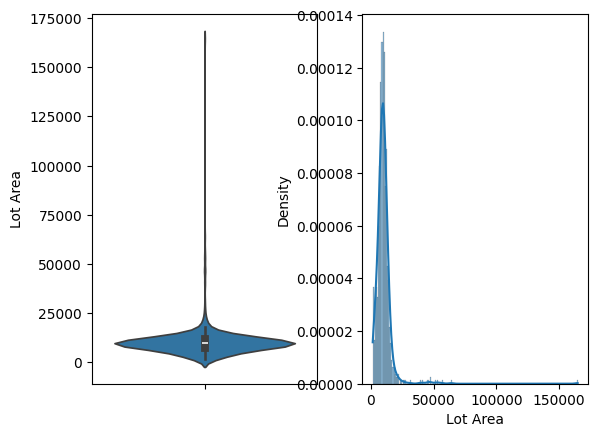

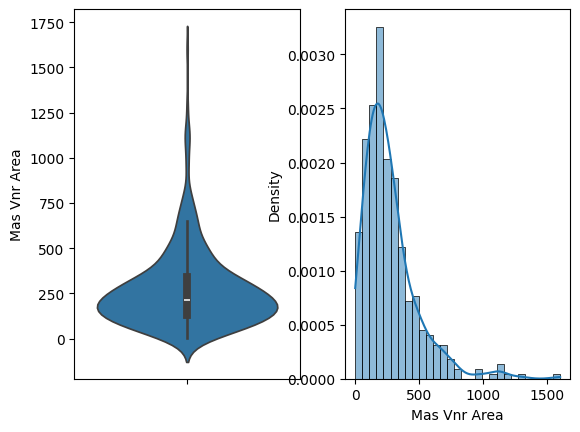

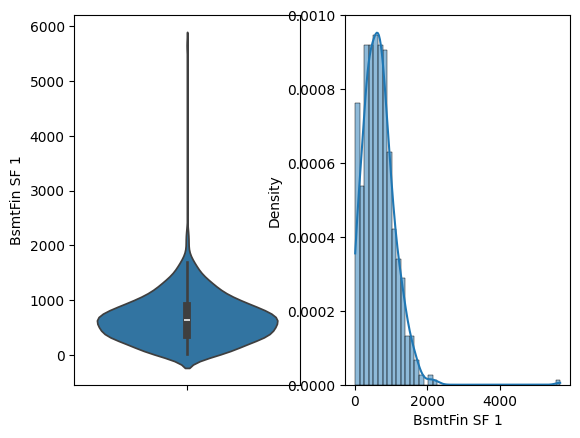

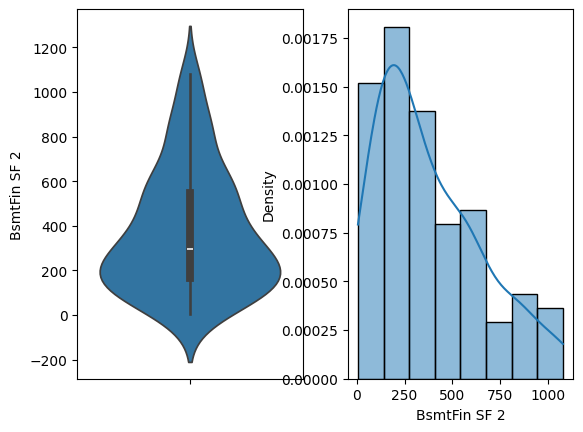

...

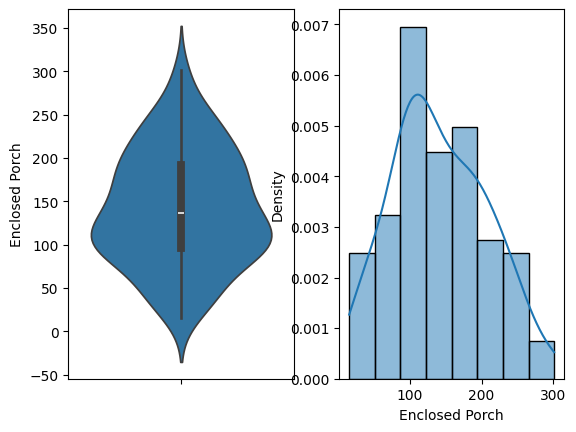

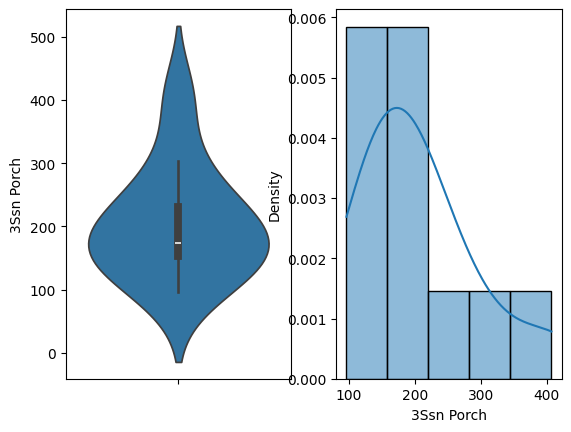

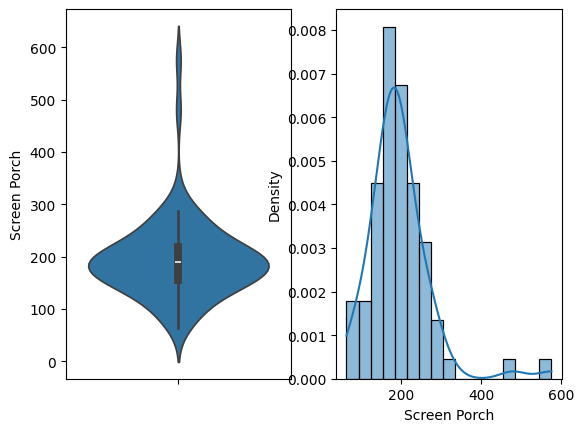

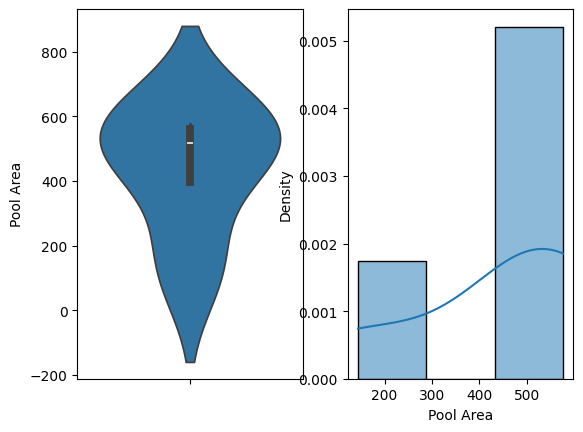

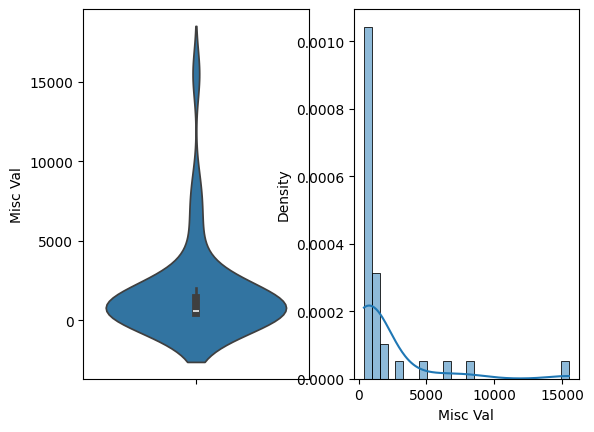

Features requiring transformation (not normally distributed): ['Lot Frontage', 'Lot Area', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', 'Gr Liv Area', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', '3Ssn Porch', 'Screen Porch', 'Misc Val', 'Pool Area', 'BsmtFin SF 2', 'Bsmt Unf SF', '2nd Flr SF', 'Low Qual Fin SF']


['Lot Frontage',
 'Lot Area',
 'Mas Vnr Area',
 'BsmtFin SF 1',
 'Total Bsmt SF',
 '1st Flr SF',
 'Gr Liv Area',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 '3Ssn Porch',
 'Screen Porch',
 'Misc Val',
 'Pool Area',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 '2nd Flr SF',
 'Low Qual Fin SF']

In [61]:
detect_distribution_exclude_zeros(df,continous_feat)

- Features that are highly positively skewed (skewness > 1) are: ['Lot Frontage', 'Lot Area', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', 'Gr Liv Area', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', '3Ssn Porch', 'Screen Porch', 'Misc Val']
- Features that are highly negatively skewed (skewness <-1) are: ['Pool Area']
- Features that are moderately positively skewed (0.5 < skewness < 1) are: ['BsmtFin SF 2', 'Bsmt Unf SF', '2nd Flr SF', 'Low Qual Fin SF']
- Features that are moderately negatively skewed (-0.5 < skewness < -1) are: []
- Features that are normally distributed (-0.5 < skewness < 0.5) are: ['Enclosed Porch']

In [223]:
log_tran =['Lot Frontage', 'Lot Area', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', 'Gr Liv Area', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', '3Ssn Porch', 'Screen Porch', 'Misc Val']
df = log_transform_exclude_zeros(df, log_tran)

In [224]:
norm = ['Enclosed Porch']
df = z_score_normalizer(df, norm)

In [225]:
mnmx = ['BsmtFin SF 2', 'Bsmt Unf SF', '2nd Flr SF', 'Low Qual Fin SF']
df = min_max_scaler(df, mnmx)

In [226]:
df = min_max_scaler(df, disc_feat)

In [66]:
df.describe()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
count,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,9.000000e+02,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000
mean,59.411111,0.544444,3.426272,9.090372,0.994444,0.106667,0.436667,0.134444,0.001111,1.097778,0.040000,9.517778,0.401111,0.056667,0.603333,3.088889,6.340000,5.583333,0.765645,0.644291,3.164444,0.050000,3.134444,3.284444,0.557778,2.370209,1.484444,2.076667,0.690000,3.595556,2.953333,1.693333,3.684444,4.207515,1.250000,0.039917,0.273866,6.781125,0.028889,3.262222,0.950000,3.913333,7.022375,0.169404,0.003894,7.285533,0.214444,0.032222,0.544815,0.205000,0.476852,1.038889,1.603333,0.388148,5.878889,0.201481,1.870000,0.813333,0.938744,1.825556,0.464167,5.890360,2.830000,2.840000,1.861111,2.570899,2.542455,-7.894919e-18,0.064151,0.428663,1.950000,0.015556,0.478889,0.044444,0.251151,0.490707,0.678889,0.313333,0.481111,192203.651111
std,43.327117,1.057429,1.663465,0.504865,0.074370,0.405414,0.579008,0.486448,0.033333,0.862902,0.212407,6.536006,1.277076,0.488021,1.330480,1.535233,1.396786,1.066608,0.214037,0.341302,0.543607,0.384271,2.403819,2.569865,0.694805,2.703562,0.606584,0.339649,0.911251,0.887926,0.531583,1.114851,2.168226,3.009429,0.905274,0.139996,0.208239,1.118040,0.296904,0.933921,0.218066,0.373243,0.330033,0.213000,0.050295,0.321935,0.259657,0.125083,0.178131,0.258186,0.134059,0.193438,0.661503,0.171387,0.596429,0.204746,1.825475,1.160453,0.213268,0.902112,0.189496,1.369510,0.684315,0.676114,0.492026,2.578967,2.133299,1.000000e+00,0.578642,1.436540,31.420128,0.235319,1.121436,0.254486,1.301273,0.253449,0.467163,0.807115,1.057143,85313.945606
min,20.000000,0.000000,0.000000,7.298445,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.011267,0.000000,0.000000,6.011267,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.395473e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [71]:
df[cat_feat].head()

,Lot Shape,Utilities,Land Slope,Overall Qual,Overall Cond,Exter Qual,Exter Cond,Bsmt Qual,Kitchen Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Electrical,Kitchen Qual,Functional,Fireplace Qu,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence,MS SubClass,MS Zoning,Street,Alley,Land Contour,Lot Config,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Foundation,Heating,Central Air,Garage Type,Misc Feature,Sale Type,Sale Condition
0,1,0,0,8,5,2,2,5,2,3,2,6,1,4,4,2,5,3,3,3,3,2,0,0,120,0,1,0,0,0,0,0,0,0,2,3,0,0,0,0,0,0,1,0,0,0,0
1,1,0,0,8,5,2,2,4,2,3,1,6,1,3,4,2,6,3,2,3,3,2,0,0,120,0,1,0,1,1,0,0,0,4,2,3,0,1,1,0,0,0,1,0,0,0,0
2,1,0,0,8,5,2,2,4,2,3,2,1,1,4,4,2,6,0,2,3,3,2,0,0,120,0,1,0,1,1,0,0,0,4,2,3,0,1,1,0,0,0,1,0,0,0,0
3,1,0,0,6,5,1,2,4,1,3,1,1,1,4,4,1,6,3,3,3,3,2,0,0,60,0,1,0,0,0,1,0,0,0,5,3,0,2,2,0,0,0,1,0,0,0,0
4,1,0,0,6,5,1,2,4,1,3,1,1,1,3,4,1,6,3,3,3,3,2,0,0,60,0,1,0,0,0,1,0,0,0,5,3,0,2,2,0,0,0,1,0,0,0,1


In [227]:
df = min_max_scaler(df, cat_feat)

In [73]:
df.isna().sum()

MS SubClass        0
MS Zoning          0
Lot Frontage       0
Lot Area           0
Street             0
Alley              0
Lot Shape          0
Land Contour       0
Utilities          0
Lot Config         0
Land Slope         0
Neighborhood       0
Condition 1        0
Condition 2        0
Bldg Type          0
House Style        0
Overall Qual       0
Overall Cond       0
Year Built         0
Year Remod/Add     0
Roof Style         0
Roof Matl          0
Exterior 1st       0
Exterior 2nd       0
Mas Vnr Type       0
Mas Vnr Area       0
Exter Qual         0
Exter Cond         0
Foundation         0
Bsmt Qual          0
Bsmt Cond          0
Bsmt Exposure      0
BsmtFin Type 1     0
BsmtFin SF 1       0
BsmtFin Type 2     0
BsmtFin SF 2       0
Bsmt Unf SF        0
Total Bsmt SF      0
Heating            0
Heating QC         0
Central Air        0
Electrical         0
1st Flr SF         0
2nd Flr SF         0
Low Qual Fin SF    0
Gr Liv Area        0
Bsmt Full Bath     0
Bsmt Half Bat

#feature selection

check for zero variance featuress

In [228]:
df.select_dtypes(include= object).columns

Index([], dtype='object')

In [300]:
df.isna().sum()

MS SubClass                       0
Lot Frontage                      0
Lot Area                          0
Street                            0
Lot Shape                         0
Utilities                         0
Land Slope                        0
Neighborhood                      0
Bldg Type                         0
House Style                       0
Overall Qual                      0
Overall Cond                      0
Year Built                        0
Year Remod/Add                    0
Roof Style                        0
Roof Matl                         0
Exterior 1st                      0
Exterior 2nd                      0
Mas Vnr Area                      0
Exter Qual                        0
Exter Cond                        0
Bsmt Qual                         0
Bsmt Cond                         0
Bsmt Exposure                     0
BsmtFin Type 1                    0
BsmtFin SF 1                      0
BsmtFin Type 2                    0
BsmtFin SF 2                

In [224]:
df.shape

(900, 131)

In [360]:
features_after_saleprice = df.loc[:, 'SalePrice':].columns[1:].tolist()

print(features_after_saleprice)

['MS Zoning_A (agr)', 'MS Zoning_C (all)', 'MS Zoning_FV', 'MS Zoning_I (all)', 'MS Zoning_RH', 'MS Zoning_RL', 'MS Zoning_RM', 'Alley_Grvl', 'Alley_No alley access', 'Alley_Pave', 'Land Contour_Bnk', 'Land Contour_HLS', 'Land Contour_Low', 'Land Contour_Lvl', 'Lot Config_Corner', 'Lot Config_CulDSac', 'Lot Config_FR2', 'Lot Config_FR3', 'Lot Config_Inside', 'Condition 1_Artery', 'Condition 1_Feedr', 'Condition 1_Norm', 'Condition 1_PosA', 'Condition 1_PosN', 'Condition 1_RRAe', 'Condition 1_RRAn', 'Condition 1_RRNe', 'Condition 1_RRNn', 'Condition 2_Artery', 'Condition 2_Feedr', 'Condition 2_Norm', 'Condition 2_PosA', 'Condition 2_PosN', 'Condition 2_RRAe', 'Condition 2_RRAn', 'Condition 2_RRNn', 'Mas Vnr Type_BrkCmn', 'Mas Vnr Type_BrkFace', 'Mas Vnr Type_Stone', 'Mas Vnr Type_no mas vnr', 'Foundation_BrkTil', 'Foundation_CBlock', 'Foundation_PConc', 'Foundation_Slab', 'Foundation_Stone', 'Heating_Floor', 'Heating_GasA', 'Heating_GasW', 'Heating_Grav', 'Heating_OthW', 'Heating_Wall',

In [229]:
from sklearn.feature_selection import VarianceThreshold

var_thresh = VarianceThreshold(threshold = 0)
var_thresh.fit(df.loc[:, :'SalePrice'])

# Get the support values and feature names
support = var_thresh.get_support()
feature_names = var_thresh.get_feature_names_out()



In [230]:
var_thresh.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True])

In [231]:
var_thresh.get_feature_names_out()

array(['MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area', 'Street',
       'Alley', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config',
       'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2',
       'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond',
       'Year Built', 'Year Remod/Add', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Mas Vnr Area',
       'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond',
       'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional',
       'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt',
       'Garage Finish'

In [232]:
var = pd.Series(var_thresh.get_support() )
var.index = var_thresh.get_feature_names_out()
var

MS SubClass        True
MS Zoning          True
Lot Frontage       True
Lot Area           True
Street             True
Alley              True
Lot Shape          True
Land Contour       True
Utilities          True
Lot Config         True
Land Slope         True
Neighborhood       True
Condition 1        True
Condition 2        True
Bldg Type          True
House Style        True
Overall Qual       True
Overall Cond       True
Year Built         True
Year Remod/Add     True
Roof Style         True
Roof Matl          True
Exterior 1st       True
Exterior 2nd       True
Mas Vnr Type       True
Mas Vnr Area       True
Exter Qual         True
Exter Cond         True
Foundation         True
Bsmt Qual          True
Bsmt Cond          True
Bsmt Exposure      True
BsmtFin Type 1     True
BsmtFin SF 1       True
BsmtFin Type 2     True
BsmtFin SF 2       True
Bsmt Unf SF        True
Total Bsmt SF      True
Heating            True
Heating QC         True
Central Air        True
Electrical      

In [233]:
(df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=True) < -0.1)

Foundation          True
Garage Type         True
Yr Sold             True
Exterior 1st        True
Exterior 2nd        True
Fence               True
MS Zoning           True
Overall Cond        True
Kitchen AbvGr       True
Enclosed Porch      True
Alley               True
Neighborhood        True
Heating            False
Condition 1        False
Misc Val           False
Misc Feature       False
Low Qual Fin SF    False
Utilities          False
Bldg Type          False
Condition 2        False
Land Contour       False
Bsmt Half Bath     False
BsmtFin SF 2       False
BsmtFin Type 2     False
Exter Cond         False
Lot Config         False
Land Slope         False
3Ssn Porch         False
Mo Sold            False
Street             False
Roof Matl          False
Lot Frontage       False
Bedroom AbvGr      False
House Style        False
Screen Porch       False
Functional         False
Pool Area          False
Bsmt Cond          False
Bsmt Unf SF        False
Sale Type          False


In [234]:
(df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=False) > 0.1)

SalePrice           True
Overall Qual        True
Gr Liv Area         True
Exter Qual          True
Kitchen Qual        True
Garage Cars         True
1st Flr SF          True
Bsmt Qual           True
Fireplace Qu        True
Year Built          True
Fireplaces          True
Garage Finish       True
Full Bath           True
Year Remod/Add      True
TotRms AbvGrd       True
Heating QC          True
Bsmt Exposure       True
Mas Vnr Area        True
Open Porch SF       True
Garage Area         True
Mas Vnr Type        True
Total Bsmt SF       True
BsmtFin Type 1      True
Lot Area            True
Wood Deck SF        True
Bsmt Full Bath      True
Garage Qual         True
Half Bath           True
2nd Flr SF          True
Paved Drive         True
Central Air         True
BsmtFin SF 1        True
Garage Yr Blt       True
Garage Cond         True
Sale Condition      True
Roof Style          True
Lot Shape           True
Electrical          True
Pool QC             True
Sale Type           True


In [235]:
# Assuming 'df' is your DataFrame
correlation_with_sale_price = df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=False)

# Get column names with correlation greater than 0.1
pos_high_correlation_columns = correlation_with_sale_price[correlation_with_sale_price > 0.1].index.tolist()

print(pos_high_correlation_columns)

['SalePrice', 'Overall Qual', 'Gr Liv Area', 'Exter Qual', 'Kitchen Qual', 'Garage Cars', '1st Flr SF', 'Bsmt Qual', 'Fireplace Qu', 'Year Built', 'Fireplaces', 'Garage Finish', 'Full Bath', 'Year Remod/Add', 'TotRms AbvGrd', 'Heating QC', 'Bsmt Exposure', 'Mas Vnr Area', 'Open Porch SF', 'Garage Area', 'Mas Vnr Type', 'Total Bsmt SF', 'BsmtFin Type 1', 'Lot Area', 'Wood Deck SF', 'Bsmt Full Bath', 'Garage Qual', 'Half Bath', '2nd Flr SF', 'Paved Drive', 'Central Air', 'BsmtFin SF 1', 'Garage Yr Blt', 'Garage Cond', 'Sale Condition', 'Roof Style', 'Lot Shape', 'Electrical', 'Pool QC', 'Sale Type', 'Bsmt Unf SF', 'Bsmt Cond', 'Pool Area', 'Functional', 'Screen Porch', 'House Style', 'Bedroom AbvGr', 'Lot Frontage']


In [236]:
#(df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=True) < -0.1)

correlation_with_sale_price = df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=True)

neg_high_correlation_columns = correlation_with_sale_price[correlation_with_sale_price < -0.1].index.tolist()

print(neg_high_correlation_columns)

['Foundation', 'Garage Type', 'Yr Sold', 'Exterior 1st', 'Exterior 2nd', 'Fence', 'MS Zoning', 'Overall Cond', 'Kitchen AbvGr', 'Enclosed Porch', 'Alley', 'Neighborhood']


In [238]:
len(pos_high_correlation_columns) +len(neg_high_correlation_columns) #+ len(features_after_saleprice)

60

In [362]:
#selected = df[pos_high_correlation_columns + neg_high_correlation_columns + features_after_saleprice]

In [239]:
df.shape

(900, 80)

In [321]:
df.head()

,MS SubClass,Lot Frontage,Lot Area,Street,Lot Shape,Utilities,Land Slope,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Area,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Alley_Grvl,Alley_No alley access,Alley_Pave,Land Contour_Bnk,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Condition 1_Artery,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Artery,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosA,Condition 2_PosN,Condition 2_RRAe,Condition 2_RRAn,Condition 2_RRNn,Mas Vnr Type_BrkCmn,Mas Vnr Type_BrkFace,Mas Vnr Type_Stone,Mas Vnr Type_no mas vnr,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Type_No Garage,Misc Feature_Gar2,Misc Feature_No Misc Feature,Misc Feature_Othr,Misc Feature_Shed
0,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,0.0,0.285714,8,5,0.919118,0.810345,0.6,0.0,0.000000,0.000000,3.806662,2,0.5,1.0,0.6,0.50,1.000000,0.0,0.166667,3.89995,0.0,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.0,0.5,0.0,0.333333,0.5,0.166667,1,0.666667,0.333333,5,0.333333,0.6,0.994522,1.000000,0.5,0.0,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.0,0.0,NaN,0.545455,1.0,0.0,0.0,247900,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,1.0,0.285714,8,5,0.889706,0.741379,0.6,0.0,0.083333,0.071429,3.806662,2,0.5,0.8,0.6,0.25,1.000000,0.0,0.166667,3.89995,0.0,-1.487304,0.75,1.0,4,-1.446127,6.033086,-0.999444,0.0,0.5,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,6,0.333333,0.6,0.992530,0.666667,0.5,0.0,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.0,0.0,NaN,0.818182,1.0,0.0,0.0,180000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,1.0,0.285714,8,5,0.882353,0.724138,0.6,0.0,0.083333,0.071429,3.806662,2,0.5,0.8,0.6,0.50,0.166667,0.0,0.166667,3.89995,0.0,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.0,0.0,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,6,0.000000,0.0,0.992032,0.666667,0.5,0.0,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.0,0.0,NaN,0.636364,1.0,0.0,0.0,180000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,60,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.04,0.0,0.714286,6,5,0.919118,0.827586,0.6,0.0,0.16666

In [322]:
df.loc[:, :'SalePrice']

,MS SubClass,Lot Frontage,Lot Area,Street,Lot Shape,Utilities,Land Slope,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Area,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,0.00,0.285714,8,5,0.919118,0.810345,0.6,0.0,0.000000,0.000000,3.806662,2,0.50,1.0,0.6,0.50,1.000000,0.000000,0.166667,3.899950,0.000000,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.5,0.0,0.333333,0.5,0.166667,1,0.666667,0.333333,5,0.333333,0.6,0.994522,1.000000,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.545455,1.0,0.000000,0.0,247900
1,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,1.00,0.285714,8,5,0.889706,0.741379,0.6,0.0,0.083333,0.071429,3.806662,2,0.50,0.8,0.6,0.25,1.000000,0.000000,0.166667,3.899950,0.000000,-1.487304,0.75,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.5,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,6,0.333333,0.6,0.992530,0.666667,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.818182,1.0,0.000000,0.0,180000
2,120,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.00,1.00,0.285714,8,5,0.882353,0.724138,0.6,0.0,0.083333,0.071429,3.806662,2,0.50,0.8,0.6,0.50,0.166667,0.000000,0.166667,3.899950,0.000000,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.0,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,6,0.000000,0.0,0.992032,0.666667,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.636364,1.0,0.000000,0.0,180000
3,60,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.04,0.00,0.714286,6,5,0.919118,0.827586,0.6,0.0,0.166667,0.142857,3.806662,1,0.50,0.8,0.6,0.25,0.166667,0.000000,0.166667,3.899950,0.000000,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.0,0.0,0.666667,0.5,0.500000,1,0.333333,0.444444,6,0.333333,0.6,0.994522,1.000000,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.545455,1.0,0.000000,0.0,181000
4,60,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.04,0.00,0.714286,6,5,0.926471,0.827586,0.6,0.0,0.166667,0.142857,3.806662,1,0.50,0.8,0.6,0.25,0.166667,0.000000,0.166667,3.899950,0.000000,-1.487304,0.75,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.0,0.0,0.666667,0.5,0.500000,1,0.333333,0.444444,6,0.333333,0.6,0.995020,1.000000,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.272727,1.0,0.000000,0.2,183000
5,60,-1.350129,-1.827958,1.0,0.000000,0.0,0.0,0.04,0.00,0.714286,6,5,0.904412,0.793103,0.6,0.0,0.083333,0.071429,3.806662,1,0.50,0.8,0.6,0.25,1.000000,0.000000,0.166667,3.899950,0.000000,-1.487304,0.75,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.5,0.0,0.666667,0.5,0.500000,1,0.333333,0.555556,6,0.333333,0.6,0.993526,1.000000,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.454545,1.0,0.000000,0.0,188000
6,60,-1.350129,-1.827958,1.0,0.333333,0.0,0.0,0.04,0.00,0.714286,7,5,0.897059,0.793103,0.6,0.0,0.250000,0.214286,3.806662,2,0.50,0.8,0.6,0.25,0.166667,0.000000,0.166667,3.899950,0.000000,-1.487304,1.00,1.0,4,-1.446127,6.033086,-0.999444,0.000000,0.0,0.0,0.666667,0.5,0.500000,1,0.666667,0.444444,6,0.333333,0.6,0.993028,1.000000,0.50,0.000000,0.6,0.6,1.0,4.152613,3.097837,3.673766,NaN,4.560696,-0.999444,0.00,0.00,NaN,0.818182,1.0,0.000000,0.0,194500
7,60,-1.35012

<Axes: >

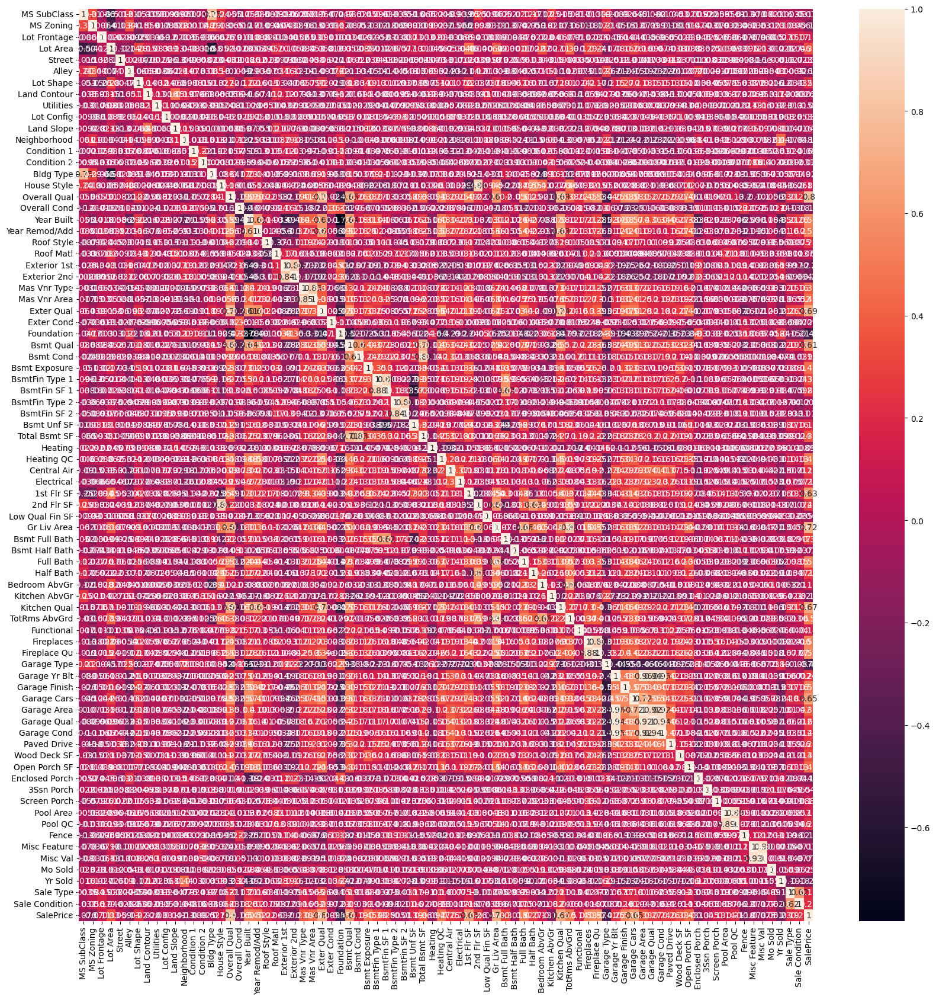

In [75]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot = True)

In [240]:
df[df.columns[1:]].corr()['SalePrice'][:].sort_values(ascending=False)

SalePrice          1.000000
Overall Qual       0.795399
Gr Liv Area        0.717475
Exter Qual         0.694859
Kitchen Qual       0.673644
Garage Cars        0.647759
1st Flr SF         0.627254
Bsmt Qual          0.614375
Fireplace Qu       0.566083
Year Built         0.542092
Fireplaces         0.529910
Garage Finish      0.525316
Full Bath          0.518844
Year Remod/Add     0.518345
TotRms AbvGrd      0.498793
Heating QC         0.469358
Bsmt Exposure      0.454356
Mas Vnr Area       0.451391
Open Porch SF      0.427624
Garage Area        0.379183
Mas Vnr Type       0.377526
Total Bsmt SF      0.358385
BsmtFin Type 1     0.334147
Lot Area           0.332488
Wood Deck SF       0.328110
Bsmt Full Bath     0.302109
Garage Qual        0.270138
Half Bath          0.265649
2nd Flr SF         0.259884
Paved Drive        0.259497
Central Air        0.253224
BsmtFin SF 1       0.247853
Garage Yr Blt      0.245084
Garage Cond        0.242926
Sale Condition     0.225456
Roof Style         0

#split data

In [241]:
remove_duplicates(df)

nuber of duplicats =  0
assumed numbers of rows remaining =  900
number of rows after removing the duplicates =  900


check for dup;icates before splitting to prevent data leakage

In [242]:
X = df.drop(columns = ['SalePrice'])
y = df['SalePrice']

In [243]:
X.head(5)

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition
0,0.588235,0.0,3.828641,8.742734,1.0,0.0,0.333333,0.000000,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.285714,0.777778,0.5,0.919118,0.810345,0.6,0.0,0.000000,0.000000,0.0,0.0,0.666667,0.5,0.0,1.0,0.6,0.50,1.000000,6.487684,0.166667,0.0,0.468184,7.417580,0.0,1.00,1.0,1.0,7.428333,0.000000,0.0,7.428333,0.5,0.0,0.333333,0.5,0.166667,1,0.666667,0.333333,0.833333,0.333333,0.6,0.0,0.994522,1.000000,0.5,6.270988,0.6,0.6,1.0,0.000000,0.000000,-0.339547,0.000000,0.000000,0,0.0,0.0,0.0,0.0,0.545455,1.0,0.0,0.0
1,0.588235,0.0,3.737670,8.593413,1.0,0.0,0.333333,0.333333,0.0,0.25,0.0,0.00,0.0,0.0,1.0,0.285714,0.777778,0.5,0.889706,0.741379,0.6,0.0,0.083333,0.071429,0.0,0.0,0.666667,0.5,0.0,0.8,0.6,0.25,1.000000,6.598509,0.166667,0.0,0.280539,7.198931,0.0,0.75,1.0,1.0,7.198931,0.000000,0.0,7.198931,0.5,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,1.000000,0.333333,0.6,0.0,0.992530,0.666667,0.5,6.137727,0.6,0.6,1.0,4.574711,0.000000,0.996168,5.129899,0.000000,0,0.0,0.0,0.0,0.0,0.818182,1.0,0.0,0.0
2,0.588235,0.0,3.688879,8.531293,1.0,0.0,0.333333,0.333333,0.0,0.25,0.0,0.00,0.0,0.0,1.0,0.285714,0.777778,0.5,0.882353,0.724138,0.6,0.0,0.083333,0.071429,0.0,0.0,0.666667,0.5,0.0,0.8,0.6,0.50,0.166667,0.000000,0.166667,0.0,0.594519,7.155396,0.0,1.00,1.0,1.0,7.155396,0.000000,0.0,7.155396,0.0,0.0,0.666667,0.0,0.333333,1,0.666667,0.222222,1.000000,0.000000,0.0,0.0,0.992032,0.666667,0.5,6.228511,0.6,0.6,1.0,0.000000,4.418841,-0.339547,0.000000,4.976734,0,0.0,0.0,0.0,0.0,0.636364,1.0,0.0,0.0
3,0.235294,0.0,4.615121,9.290998,1.0,0.0,0.333333,0.000000,0.0,0.00,0.0,0.04,0.0,0.0,0.0,0.714286,0.555556,0.5,0.919118,0.827586,0.6,0.0,0.166667,0.142857,0.0,0.0,0.333333,0.5,0.0,0.8,0.6,0.25,0.166667,0.000000,0.166667,0.0,0.430098,6.831954,0.0,1.00,1.0,1.0,6.831954,0.328329,0.0,7.380879,0.0,0.0,0.666667,0.5,0.500000,1,0.333333,0.444444,1.000000,0.333333,0.6,0.0,0.994522,1.000000,0.5,6.154858,0.6,0.6,1.0,0.000000,3.610918,-0.339547,0.000000,0.000000,0,0.0,0.0,0.0,0.0,0.545455,1.0,0.0,0.0
4,0.235294,0.0,4.304065,9.322329,1.0,0.0,0.333333,0.000000,0.0,0.00,0.0,0.04,0.0,0.0,0.0,0.714286,0.555556,0.5,0.926471,0.827586,0.6,0.0,0.166667,0.142857,0.0,0.0,0.333333,0.5,0.0,0.8,0.6,0.25,0.166667,0.000000,0.166667,0.0,0.432884,6.838405,0.0,0.75,1.0,1.0,6.838405,0.339467,0.0,7.398786,0.0,0.0,0.666667,0.5,0.500000,1,0.333333,0.444444,1.000000,0.333333,0.6,0.0,0.995020,1.000000,0.5,6.133398,0.6,0.6,1.0,0.000000,3.688879,-0.339547,0.000000,0.000000,0,0.0,0.0,0.0,0.0,0.272727,1.0,0.0,0.2


In [244]:
y

0      247900
1      180000
2      180000
3      181000
4      183000
5      188000
6      194500
7      185000
8      189000
9      188500
10     355000
11     325000
12     387000
13     115000
14     334000
15     133000
16     215000
17     226500
18     175500
19     181900
20     235000
21     220000
22     272000
23     161000
24     175000
25     185000
26     146900
27     292500
28     180000
29     159900
30     205000
31     157000
32     306000
33     133000
34     151000
35     111900
36     123000
37     111250
38     181000
39     103400
40     100000
41     100500
42     106000
43      85400
44      89500
45     111750
46     140000
47     143000
48     148500
49     110000
50     394617
51     426000
52     385000
53     446261
54     317500
55     372402
56     417500
57     383000
58     390000
59     460000
60     379000
61     250000
62     316000
63     615000
64     412500
65     284000
66     284000
67     421250
68     370000
69     336860
70     367294
71    

In [245]:
from sklearn.model_selection import train_test_split

In [246]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

#modeling

In [247]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

regr = RandomForestRegressor()
regr.fit(X_train, y_train)

RandomForestRegressor()

In [248]:
y_pred = regr.predict(X_test)

In [249]:
y_pred

array([357677.44, 248906.8 , 175386.01, 197999.72, 102413.5 , 173930.72,
       112097.32, 248120.36, 308159.08, 181555.18, 184459.44, 168327.24,
       216669.88, 220081.7 , 298181.82, 132499.1 , 264100.6 , 211782.01,
       143649.  , 364380.84, 147928.58, 184622.03, 351307.13, 111700.25,
       134269.5 , 145387.25, 189397.  , 192721.38, 168097.05, 159103.96,
       170167.99, 167336.35,  97673.5 , 159463.  , 199153.25, 110734.57,
       167205.7 , 197411.68, 146592.  , 152095.67, 464533.62, 159228.71,
       133761.5 , 171676.17, 167104.9 , 223590.47, 140136.5 , 156014.51,
       153860.5 , 308689.8 , 267170.31, 151977.64, 110391.58, 166521.  ,
       113728.73, 167856.88, 184771.42, 137684.15,  81149.58, 169104.11,
        98595.5 , 150543.62, 174696.28, 141619.  , 165958.36, 173648.8 ,
       117638.14, 131097.05, 149919.19, 164292.69, 165262.91, 291519.86,
       119717.12, 130778.5 , 158000.54, 170361.32, 155188.1 , 184902.68,
       351397.64, 169578.19, 148935.  , 211985.28, 

In [250]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Root Mean Squared Error: 24376.942867349513
R-squared: 0.9067778180518133


In [256]:
feature_importances = regr.feature_importances_
feature_names = X.columns

data = {'feature': feature_names, 'importance': feature_importances}
data= pd.DataFrame(data)

df_sorted = data.sort_values(by='importance')

df_sorted

,feature,importance
8,Utilities,0.000002
4,Street,0.000012
13,Condition 2,0.000039
44,Low Qual Fin SF,0.000045
73,Misc Feature,0.000070
74,Misc Val,0.000070
68,3Ssn Porch,0.000077
41,Electrical,0.000100
38,Heating,0.000101
34,BsmtFin Type 2,0.000176


In [264]:
df_sorted[df_sorted['importance'] > 0.004700]['feature'].tolist()

['Kitchen Qual',
 'Garage Yr Blt',
 'Year Remod/Add',
 'Bsmt Qual',
 'Garage Area',
 'Year Built',
 'Lot Area',
 'Garage Cars',
 '2nd Flr SF',
 'BsmtFin SF 1',
 '1st Flr SF',
 'Total Bsmt SF',
 'Gr Liv Area',
 'Overall Qual']

In [265]:
imp_feat = df_sorted[df_sorted['importance'] > 0.004700]['feature'].tolist()

In [266]:
regr = RandomForestRegressor()
regr.fit(X_train[imp_feat], y_train)

RandomForestRegressor()

In [271]:
y_pred = regr.predict(X_test[imp_feat])

In [272]:
y_pred

array([366421.33, 252834.6 , 173563.  , 210855.72,  98726.  , 173039.42,
       108402.5 , 248017.56, 288742.09, 181265.04, 179321.33, 172136.  ,
       216263.7 , 220707.65, 304694.67, 134307.4 , 263879.66, 207098.68,
       150052.5 , 374721.93, 148779.52, 190886.47, 335609.25, 109779.  ,
       140298.5 , 139118.38, 189613.5 , 193963.14, 167727.  , 150080.14,
       160449.  , 167636.32, 101867.5 , 150548.  , 198023.44, 107889.  ,
       170905.09, 210067.71, 145971.5 , 148497.28, 463346.52, 161494.79,
       128744.5 , 168873.12, 162161.04, 222404.03, 138531.5 , 141022.13,
       156111.08, 324742.19, 235005.68, 150434.  , 103183.98, 159489.  ,
       119712.55, 162146.54, 184203.45, 136987.21,  74162.25, 164539.83,
        95705.  , 148540.85, 175803.02, 140197.05, 167088.86, 179587.5 ,
       115577.25, 130821.5 , 143716.  , 163140.2 , 164057.02, 290517.85,
       119129.6 , 127741.5 , 162997.5 , 171415.4 , 149459.05, 180505.96,
       357722.05, 170298.19, 158703.14, 209205.34, 

In [274]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Root Mean Squared Error: 23774.29804880313
R-squared: 0.9113301056933178


#why random forest ?
after looking and analysing the data it contains so many outliers and not notmally distributed, have variouse types of data (continouse, discrete , nominal and ordinal), and there is a big chance that the model would overfit, so random forest in the best choice for this case as it can handles various data types extensive data preprocessing also random forests are less sensitive to outliers in the data compared to some other algorithms,and by using multiple decision trees and introducing randomness during training, it is less likely to overfit the training data and can generalize better to unseen data, it also provides feature importance that after i used it and chose some featutes the retrained the model, its performance was improved not ,uch but still improved

#pca

In [153]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt


In [154]:
PCA_train = df.copy()

In [155]:
#elbow method for k-means clustering
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 187, 3)


for k in K:
    # Building and fitting the model
    print(k)
    kmeanModel = KMeans(n_clusters=k).fit(PCA_train)
    kmeanModel.fit(PCA_train)

    distortions.append(sum(np.min(cdist(PCA_train, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / PCA_train.shape[0])
    inertias.append(kmeanModel.inertia_)

    mapping1[k] = sum(np.min(cdist(PCA_train, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / PCA_train.shape[0]
    mapping2[k] = kmeanModel.inertia_

1
4
7
10
13
16
19
22
25
28
31
34
37
40
43
46
49
52
55
58
61
64
67
70
73
76
79
82
85
88
91
94
97
100
103
106
109
112
115
118
121
124
127
130
133
136
139
142
145
148
151
154
157
160
163
166
169
172
175
178
181
184


In [156]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 62554.39786408521
4 : 22086.553683425565
7 : 13640.65340631906
10 : 9505.195444394982
13 : 7803.558696725872
16 : 6079.034905995485
19 : 4943.454495711149
22 : 4329.177342916832
25 : 3806.629983725327
28 : 3339.4781877884598
31 : 2846.149972685539
34 : 2676.8732881272176
37 : 2418.5718102614637
40 : 2177.6187855074463
43 : 2106.9250564247186
46 : 1920.3610684096982
49 : 1720.0573017944348
52 : 1548.6903677514056
55 : 1554.683904261483
58 : 1417.0725136960264
61 : 1348.4249397056353
64 : 1258.4649040655106
67 : 1152.2437102636568
70 : 1140.007793566052
73 : 1086.3347186185813
76 : 1001.2767543728115
79 : 975.9489679501293
82 : 931.1073904343353
85 : 876.4255678935737
88 : 836.0260369539412
91 : 814.4862683471675
94 : 766.0341925456308
97 : 718.9890663545964
100 : 732.0311649800187
103 : 690.5743931015558
106 : 628.0159446482312
109 : 620.0569557863362
112 : 603.7640997651788
115 : 580.5196109458785
118 : 561.4621813003406
121 : 557.4639190970602
124 : 533.5492921707928
127 : 512.089

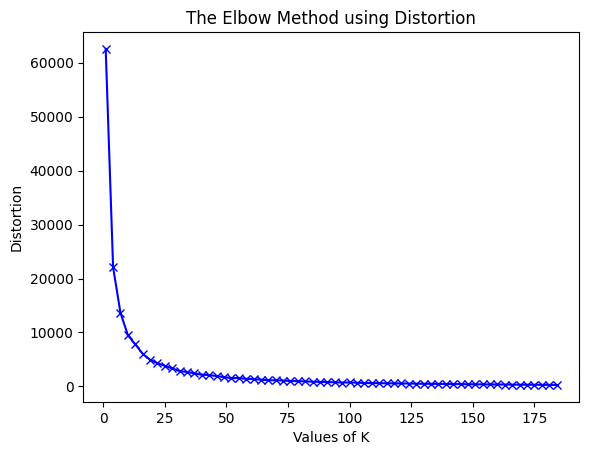

In [157]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

In [158]:

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
pca = PCA()
pca.fit(X)


PCA()

In [159]:
pca.explained_variance_ratio_

array([9.59544060e-01, 1.15103976e-02, 6.86321680e-03, 5.59689984e-03,
       3.86858862e-03, 2.68141337e-03, 2.05855455e-03, 1.71699570e-03,
       1.59367845e-03, 1.04823323e-03, 8.95679440e-04, 3.44748916e-04,
       3.27254382e-04, 2.41059864e-04, 1.96661857e-04, 1.59910602e-04,
       1.25221871e-04, 9.45542873e-05, 7.35159999e-05, 7.24848173e-05,
       6.49492952e-05, 5.69350649e-05, 5.24494288e-05, 4.92998334e-05,
       4.48955853e-05, 4.38872620e-05, 4.15979733e-05, 4.00301716e-05,
       3.77861863e-05, 3.52233361e-05, 3.30365348e-05, 3.15840383e-05,
       3.12162057e-05, 2.88239326e-05, 2.67785249e-05, 2.60214762e-05,
       2.49992079e-05, 2.22774615e-05, 2.19114030e-05, 2.09359495e-05,
       1.86431969e-05, 1.85904565e-05, 1.64479449e-05, 1.42875973e-05,
       1.30359088e-05, 1.21328362e-05, 1.14639683e-05, 1.07814276e-05,
       1.01627092e-05, 1.00187558e-05, 8.75620858e-06, 8.18191332e-06,
       7.68859887e-06, 7.37229385e-06, 7.04259868e-06, 6.57562037e-06,
      

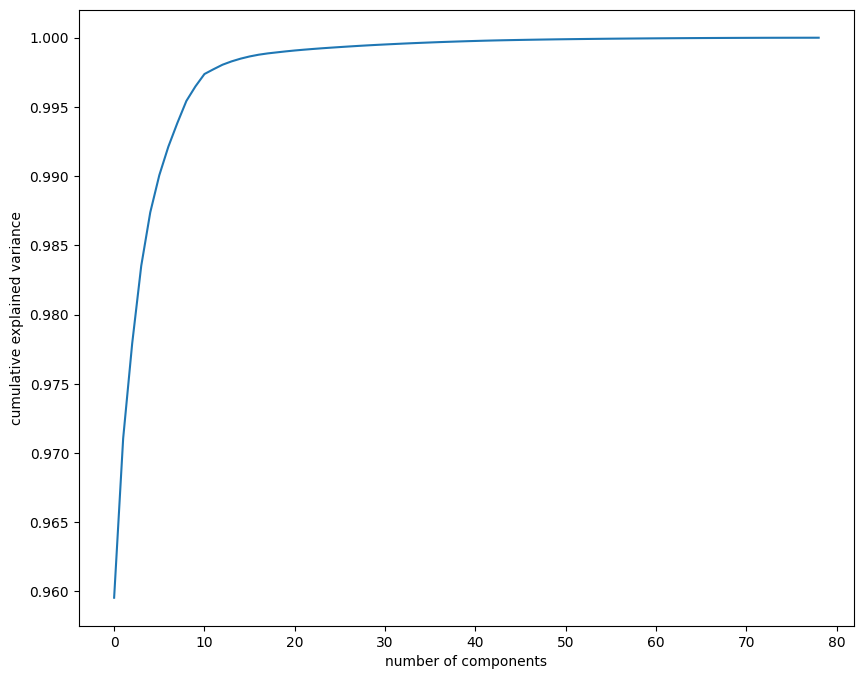

In [160]:

plt.figure(figsize = (10,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [161]:
from sklearn.decomposition import PCA
def apply_PCA(X, num_components):
  pca = PCA(num_components)
  components = pca.fit_transform(X)
  pd.DataFrame(components).head()
  return pd.DataFrame(components)

In [162]:

data__per = apply_PCA(X, 0.9)

In [163]:
data__per

,0
0,-1.947993
1,-1.926948
2,-1.987916
3,-1.984994
4,-1.985633
5,-1.934223
6,-1.975259
7,-1.957427
8,-1.915238
9,-1.948703


In [172]:
data_comp = apply_PCA(X, 15)

In [173]:
data_comp

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-1.947993,0.735946,-4.392889,-0.570694,-0.352067,-0.699088,0.074719,-1.140008,-1.195826,-0.251749,-0.902710,-0.091384,-0.020143,0.725062,-0.668941
1,-1.926948,-0.922119,-3.008911,3.227058,-0.768242,-0.809373,-0.281308,-0.615789,-0.954019,-0.578303,0.419588,1.762508,4.831383,0.833883,0.082723
2,-1.987916,4.605182,1.349398,-1.703951,2.228618,-0.451514,4.457812,1.610598,0.201836,-0.396263,-0.523401,1.248879,-0.019968,-0.002087,0.159965
3,-1.984994,4.986501,1.465072,-1.260387,1.457996,-0.862048,0.325144,-0.902709,-0.670590,-0.089483,-0.515324,-0.272123,0.070880,0.023558,-0.515235
4,-1.985633,4.974771,1.465249,-1.256089,1.521683,-0.558530,0.327708,-0.833332,-0.674175,-0.110194,-0.520740,-0.312481,0.070696,0.012231,-0.485424
5,-1.934223,-0.981578,-0.282395,3.383271,2.820636,3.085297,-0.193437,0.681913,-0.710868,0.410708,-0.029864,-0.006230,0.010367,-0.164477,-0.423946
6,-1.975259,3.125842,2.711877,3.627259,1.560465,4.089483,0.968098,-2.448993,4.596385,0.276048,-1.098631,0.068499,0.230509,0.166292,-0.675848
7,-1.957427,-2.374708,-0.662928,-3.579294,0.208211,3.608716,-0.604369,0.339681,-0.207320,0.282930,-0.202232,-0.488704,-0.040208,-0.402681,-0.170381
8,-1.915238,-1.832443,-0.794098,2.800516,3.384811,-0.593270,-0.505116,0.072778,-0.605244,0.331950,-0.075825,0.870980,-0.077168,0.117226,-0.077053
9,-1.948703,0.859658,-2.379646,-1.416266,3.002315,-0.681648,-0.589482,-0.772069,-0.454174,-1.459411,1.938786,0.867221,-0.083162,0.627364,-0.021025


In [174]:
data_comp.shape

(900, 15)

In [175]:
X_train, X_test, y_train, y_test = train_test_split(data_comp, y, test_size=0.1, random_state=42)

In [176]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

regr = RandomForestRegressor()
regr.fit(X_train, y_train)

RandomForestRegressor()

In [177]:
y_pred = regr.predict(X_test)

In [178]:
y_pred

array([323714.12, 281691.43, 180598.28, 169419.6 , 123490.  , 178917.83,
       115976.7 , 190586.41, 318085.63, 197751.28, 187901.2 , 195158.09,
       204281.7 , 184844.87, 226362.31, 111854.14, 248326.5 , 189313.34,
       148512.05, 299562.03, 145750.  , 185317.22, 205009.34, 154408.1 ,
       151181.18, 158072.83, 215504.58, 200027.6 , 189346.43, 201591.99,
       197041.26, 165037.39, 100800.32, 147518.02, 202480.38, 139328.  ,
       182464.18, 167592.16, 141265.  , 141220.5 , 455610.4 , 171264.84,
       117190.91, 172310.65, 201418.75, 197341.8 , 137449.95, 146186.74,
       165149.  , 246945.37, 261001.94, 142790.91,  73299.  , 187719.  ,
       143009.34, 163469.59, 181764.03, 134639.8 ,  90897.5 , 176170.65,
       115049.72, 187071.14, 170649.94, 149891.45, 191714.51, 160581.46,
       126790.88, 124466.19, 139666.12, 153711.69, 164462.98, 229884.75,
       132523.59, 154062.77, 175376.82, 192272.38, 161120.55, 200455.5 ,
       374317.2 , 180148.43, 128563.24, 187921.5 , 

In [179]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Root Mean Squared Error: 35813.58239679547
R-squared: 0.7987868707210157
